# импорт пакетов

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import LineCollection

from sklearn import preprocessing
from sklearn import metrics
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import sklearn.metrics as mtrcs
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV


import seaborn as sns
from IPython.display import display
sns.set()
sns.set_context("talk")

%matplotlib inline

# пишем функции для массовой обработки

In [2]:
def drawColumnAsTimeSeries(data, name, trueName=None, drawSeqLine=True):

    # значения заполненных данных
    y1=data[name][data[name].notna()].values
    # индексы заполненных данных (от 1 до ...) для графиков
    x1=data[name][data[name].notna()].index+1
    # индексы пропущенных данных (от 1 до ...) для графиков
    x2=data[name][data[name].isnull()].index+1
    # массив для значений интерполированных данных
    y2=np.zeros(len(x2))

    fig, ax = plt.subplots(figsize=(25,5))
    ax.scatter(x1,y1, color='green', marker='d', label='данные')
    if drawSeqLine:
        a=x1[0]
        xx1=[]
        xx1.append(x1[0])
        yy1=[]
        yy1.append(y1[0])
        collect=[]
        for i in range(len(x1)-1):
            if (x1[i+1]-a)==1:
                xx1.append(x1[i+1])
                yy1.append(y1[i+1])
                a=x1[i+1]
            else:
                if len(xx1)>1:
                    ax.plot(xx1,yy1, color='blue')
                a=x1[i+1]
                xx1=[]
                xx1.append(x1[i+1])
                yy1=[]
                yy1.append(y1[i+1])        

    ax.scatter(x2,y2, color='orange', marker='.', label='пропущенные значения (0)')
    ax.hlines(np.mean(y1),1,len(data.index), color='red', label='среднее')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    if trueName==None:
        ax.set_title(name, fontsize=16)
    else:
        ax.set_title(trueName, fontsize=16)
    # plt.savefig('report_v2/missingValuesRaw_AE1.png', dpi=300, bbox_inches='tight')
    plt.show()


In [3]:
def drawFillNan(data, name, trueName):
    y1=data[name][data[name].notna()].values
    x1=data[name][data[name].notna()].index+1

    xEmpty=data[name][data[name].isnull()].index+1
    yMean=np.array(len(xEmpty)*[np.mean(y1)])
    yMedian=np.array(len(xEmpty)*[np.median(y1)])

    xWhole=np.concatenate((x1,xEmpty), axis=None)
    yWholeMean=np.concatenate((y1,yMean), axis=None)[xWhole.argsort()]
    yWholeMedian=np.concatenate((y1,yMedian), axis=None)[xWhole.argsort()]
    xWhole=xWhole[xWhole.argsort()]

    dataAE1=data[name].copy()
    yPad=dataAE1.fillna(method='pad').copy()
    yIntLin=dataAE1.interpolate(method='linear').copy()
    yIntCubic=dataAE1.interpolate(method='cubic').copy()
    yIntQuadr=dataAE1.interpolate(method='quadratic').copy()
    yIntSpline=dataAE1.interpolate(method='spline', order=2).copy() 

    fig, ax = plt.subplots(figsize=(25,5))

    ax.scatter(x1,y1, color='green', marker='d', label='данные')

    ax.plot(xWhole,yWholeMean, color='orange', marker='.', label='Mean')
    #ax.plot(xWhole,yWholeMedian, color='orange', marker='.', label='Median')
    ax.plot(xWhole,yPad.values, color='red', marker='.', label='pad')
    ax.plot(xWhole,yIntLin.values, color='blue', marker='.', label='Interpolation Linear')
    ax.plot(xWhole,yIntCubic.values, color='black', marker='.', label='Interpolation Cubic')
    ax.plot(xWhole,yIntCubic.values, color='green', marker='.', label='Interpolation Quadratic')
    ax.plot(xWhole,yIntCubic.values, color='purple', marker='.', label='Interpolation Spline(2)')
    ax.set_xlim(1,len(data.index))
    #ax.set_xlim(100,130)
    ax.legend(fontsize=14)
    ax.set_title(trueName, fontsize=16)
    #plt.savefig('report_v2/missingValuesInterpollated_AE1.png', dpi=300, bbox_inches='tight')
    plt.show()   


In [4]:
def drawHistograms(data, name, trueName=None):
    plt.figure(figsize=(12, 8))
    if trueName==None:
        label=name
    else:
        label=trueName
    sns.distplot( data[name], color='g', bins=50, 
            hist_kws={'alpha': 0.5}, axlabel=label )
    plt.show()


In [5]:
def analyzeMissingValues(data):
    print('=======================================================')
    print('Пропущенные данные (из', len(data.index),'записей):')
    print(data.isnull().sum())
    print('=======================================================')
    print('Пропущенные данные, % (из', len(data.index),'записей):')
    print(data.isnull().sum()/len(data.index)*100)
    print('=======================================================')


In [6]:
def drawCorrMatrix(data, colomunsToRemove=None):
    if colomunsToRemove==None:
        corr = dataSingleUnit.corr()
    else:
        corr = dataSingleUnit.drop(['Temp','KO'], axis=1).corr()
    plt.figure(figsize=(12, 10))
    ax = sns.heatmap(corr, annot=True, vmax=1, vmin=-1, cmap='RdYlGn')
    ax.set_title('Корреляции независимых переменных', fontsize=20)
    plt.tight_layout(pad=0.4)
    plt.show()


In [7]:
def analyzeCorrWithTargets(data, targets, threshold=0.3):
    
    print('#################################################')
    print('###### Корреляция с целевыми переменными   ######')
    print('#################################################')
    
    for name in targets:
        print('')
        print('Корреляция с переменной \'',name,'\':')
        display(data.corr()[name].drop(targets).sort_values(ascending=False))
        print('-------------------------------------------------')
            
        if len(data.corr()[name].drop(targets)[abs(data.corr()[name].drop(targets))>threshold].sort_values(ascending=False).values)==0:
            print('Нет корреляций больше заданного порога (', threshold, ')')
        else:
            print('Корреляции больше заданного порога (', threshold, ') с переменной',name,':')
            display(data.corr()[name].drop(targets)[abs(data.corr()[name].drop(targets))>threshold].sort_values(ascending=False))
        print('-------------------------------------------------')


In [8]:
def drawPairPlots(data, inputColunms, targetColumns, trueNamesDict=None):
    
    for yName in targetColumns:
        
        for i in range(0, len(inputColunms), 2):

            ax=sns.pairplot(data=data,
                        x_vars=inputColunms[i:i+2],
                        y_vars=yName,
                        plot_kws={
                                    'line_kws':{'color':'orange'},
                                    'scatter_kws': {'color': 'g', 's': 7}
                                },
                        diag_kind='kde', kind='reg', height=7)
            
            if trueNamesDict != None:
                for ax_ in ax.axes.flat:
                    ax_.tick_params(axis='y', labelleft=True) # method 1
                    # ax_.yaxis.set_tick_params(labelleft=True) # method 2
                    ax_.set_xlabel(trueNamesDict[ax_.get_xlabel()])
                    ax_.set_ylabel(trueNamesDict[yName])
            ax.fig.tight_layout()


In [9]:
def drawPCAFlatPlot(pcaData, data, targetColumns, trueNamesDict=None):
    for name in targetColumns:
        fig, ax = plt.subplots(figsize=(10,10))
        ax1=ax.scatter(pcaData[:,0],pcaData[:,1], c=data[name], cmap=cm.jet)
        if trueNamesDict != None:
            ax.set_title(trueNamesDict[name], fontsize=16)    
        else:
            ax.set_title(name, fontsize=16)
        ax.set_xlabel('pca_var_1')
        ax.set_ylabel('pca_var_2')
        fig.colorbar(ax1, ax=ax)
        plt.tight_layout(pad=0.4)
        plt.show()


In [10]:
def drawPCA3DPlot(pcaData, data, targetColumns, trueNamesDict=None):
    for name in targetColumns:
        fig = plt.figure(figsize=(18,8))

        ax = fig.add_subplot(121, projection='3d')
        ax.plot_trisurf(pcaData[:,0],pcaData[:,1],
            data[name], cmap=cm.jet, linewidth=0)
        ax.set_xlabel('pca_var_1')
        ax.set_ylabel('pca_var_2')
        ax.set_xlabel('pca_var_1',labelpad=15)
        ax.set_ylabel('pca_var_2',labelpad=15)
        ax.set_facecolor('white') 

        ax = fig.add_subplot(122, projection='3d')
        ax.scatter(pcaData[:,0],pcaData[:,1],
            data[name], cmap=cm.jet, linewidth=0)
        ax.set_xlabel('pca_var_1',labelpad=15)
        ax.set_ylabel('pca_var_2',labelpad=15)
        ax.set_facecolor('white') 

        if trueNamesDict != None:
            fig.suptitle(trueNamesDict[name], fontsize=16)
        else:
            fig.suptitle(name, fontsize=16)

        fig.tight_layout()

        plt.show()


In [11]:
def analyzeLinModels(data, inputNames, targetName, realNamesDict=None, numRuns=40):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    
    mse=[]
    r2score=[]
    mae=[]


    for run in range(numRuns):
        trainInputs, testInputs, trainTargets, testTargets = train_test_split(X, Y, test_size=0.25)
        # linear
        linearModel=LinearRegression()
        linearModel.fit(trainInputs,trainTargets)
        predicted = linearModel.predict(testInputs)
        mse.append( mtrcs.mean_squared_error(testTargets, predicted, squared=False) )
        r2score.append( mtrcs.r2_score(testTargets, predicted) )
        mae.append( mtrcs.mean_absolute_error(testTargets, predicted) )
    
    rez=pd.DataFrame({
                        'best': [np.min(mse), np.max(r2score), np.min(mae)],  
                        'mean': [np.mean(mse), np.mean(r2score), np.mean(mae)], 
                        'std': [np.std(mse), np.std(r2score), np.std(mae)],
                        'median': [np.median(mse), np.median(r2score), np.median(mae)], 
                        'worst':[np.max(mse), np.min(r2score), np.max(mae)]  
                    }, index=['mse','r2Score','mae'])

    return rez


In [12]:
def buildLinModels(data, inputNames, targetName, realNamesDict=None, drawRez=False):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    # linear
    linearModel=LinearRegression()
    linearModel.fit(X,Y)
    predicted = linearModel.predict(X)
    mse =  mtrcs.mean_squared_error(Y, predicted, squared=False) 
    r2score =  mtrcs.r2_score(Y, predicted) 
    mae =  mtrcs.mean_absolute_error(Y, predicted)
    coef=pd.DataFrame({"Переменная": inputNames, "Coefficients": linearModel.coef_})
    coef.loc[len(coef)]=['intercept_coef', linearModel.intercept_]

    if drawRez:
        xAxis=np.arange(1,len(Y)+1)
        fig, ax = plt.subplots(figsize=(25,5))
        ax.scatter(xAxis,Y, color='green', marker='.', label='данные')
        ax.scatter(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(25,5))
        ax.plot(xAxis,Y, color='green', marker='.', label='данные')
        ax.plot(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()        

    return {'mse':mse, 'r2score':r2score, 'mae':mae}, coef


In [13]:
def analyzeSVRModels(data, inputNames, targetName, realNamesDict=None, numRuns=40, verbose=True):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    
    mse=[]
    r2score=[]
    mae=[]

    print('--------------------------------------------')
    print('SVR model analysis starts.')
    for run in range(numRuns):
        trainInputs, testInputs, trainTargets, testTargets = train_test_split(X, Y, test_size=0.25)
 
        parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
        modelSVR=SVR()
        
        gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
        gridSVR.fit(trainInputs,trainTargets)
        bestModel = gridSVR.best_estimator_
        
        bestModel.fit(trainInputs,trainTargets)
        predicted = bestModel.predict(testInputs)

        mse.append( mtrcs.mean_squared_error(testTargets, predicted, squared=False) )
        r2score.append( mtrcs.r2_score(testTargets, predicted) )
        mae.append( mtrcs.mean_absolute_error(testTargets, predicted) )

        if verbose:
            print('Run', run+1, 'from',numRuns)
    
    rez=pd.DataFrame({
                        'best': [np.min(mse), np.max(r2score), np.min(mae)],  
                        'mean': [np.mean(mse), np.mean(r2score), np.mean(mae)], 
                        'std': [np.std(mse), np.std(r2score), np.std(mae)],
                        'median': [np.median(mse), np.median(r2score), np.median(mae)], 
                        'worst':[np.max(mse), np.min(r2score), np.max(mae)]  
                    }, index=['mse','r2Score','mae'])
    print('All runs are done.')
    return rez


In [14]:
def buildSVRModels(data, inputNames, targetName, realNamesDict=None, drawRez=False):
    
    X=data[inputNames].copy()
    Y=data[targetName].copy()
    # SVR
    parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(X,Y)
    bestModel = gridSVR.best_estimator_
    
    bestModel.fit(X,Y)
    predicted = bestModel.predict(X)    
    
    mse =  mtrcs.mean_squared_error(Y, predicted, squared=False) 
    r2score =  mtrcs.r2_score(Y, predicted) 
    mae =  mtrcs.mean_absolute_error(Y, predicted)

    if drawRez:
        xAxis=np.arange(1,len(Y)+1)
        fig, ax = plt.subplots(figsize=(25,5))
        ax.scatter(xAxis,Y, color='green', marker='.', label='данные')
        ax.scatter(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(25,5))
        ax.plot(xAxis,Y, color='green', marker='.', label='данные')
        ax.plot(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()        

    return {'mse':mse, 'r2score':r2score, 'mae':mae}, bestModel


 # Импорт данных и названий переменных

In [15]:
# get names for units
units = pd.read_excel('raw\Техпараметры.xlsx',\
    skiprows=3, nrows=1, header=None)
unitNames=units.dropna(axis=1).iloc[[0]].values[0]
len(unitNames)


168

In [52]:
paramNames=['Ур-нь металла, см', 'Ур-нь электролита, см',
    'Температура, С', 'КО',	'CaF2, %', 'Шумы, В',
    'Рабочее напряжение, В', 'Среднее время МАЙНА, сек',
    'Кол-во доз АПГ в автомат. режиме',	
    'Уставка АПГ, мин', 'Перепад напряжения в подине']
columnNames = ['Metal', 'Electrolyte', 'Temp',
    'KO', 'CAF2', 'Noise', 'Voltage', 'Mynah', 
    'Doze', 'APG', 'dVoltage']
paramNamesDictionary = dict(zip(columnNames, paramNames))    
inputNames = ['Metal', 'Electrolyte',
     'CAF2', 'Noise', 'Voltage', 'Mynah', 
    'Doze', 'APG', 'dVoltage']
outputNames=[ 'Temp', 'KO']    
columnsNumber=11

# ДЛя примера. Анализ первого набора данных (электролизера) из 168

In [17]:

dataSingleUnit = pd.read_excel('raw\Техпараметры.xlsx',\
    skiprows=5, usecols=range(2,2+11), header=None)
dataSingleUnit.columns=columnNames

# описательная статистика

In [18]:
# check dataframe
display( dataSingleUnit.info() )
display( dataSingleUnit.head() )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455 entries, 0 to 454
Data columns (total 11 columns):
Metal          342 non-null float64
Electrolyte    342 non-null float64
Temp           342 non-null float64
KO             125 non-null float64
CAF2           125 non-null float64
Noise          455 non-null float64
Voltage        455 non-null float64
Mynah          446 non-null float64
Doze           455 non-null int64
APG            455 non-null float64
dVoltage       26 non-null float64
dtypes: float64(10), int64(1)
memory usage: 39.2 KB


None

,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,17.0,14.0,961.0,2.20,5.05,0.023,4.132,41.0,4078,1.4,NaN
1,17.0,16.0,953.0,NaN,NaN,0.013,4.057,4.0,4267,1.3,NaN
2,NaN,NaN,NaN,NaN,NaN,0.015,4.122,20.0,4130,1.3,NaN
3,17.0,13.0,960.0,NaN,NaN,0.015,4.045,33.0,3585,1.3,NaN
4,17.0,19.0,953.0,2.18,5.14,0.023,4.094,25.0,3876,1.4,NaN


In [19]:
# descriptive stats
dataSingleUnit.describe()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
count,342.000000,342.000000,342.000000,125.000000,125.000000,455.000000,455.000000,446.000000,455.000000,455.000000,26.000000
mean,17.736842,16.181287,964.511696,2.250560,5.136080,0.011967,4.014637,14.919283,4062.553846,1.380879,306.192308
std,0.785342,1.755394,7.184100,0.070669,0.176594,0.004100,0.062526,8.966241,165.793689,0.047946,11.264171
min,15.000000,10.000000,944.000000,2.110000,4.600000,0.007000,3.872000,2.000000,3327.000000,1.300000,284.000000
25%,17.000000,15.000000,960.000000,2.200000,5.040000,0.009000,3.967000,9.000000,3972.000000,1.400000,299.500000
50%,18.000000,16.000000,964.000000,2.250000,5.140000,0.011000,4.003000,13.000000,4068.000000,1.400000,306.000000
75%,18.000000,17.000000,968.000000,2.290000,5.250000,0.014000,4.061000,19.000000,4168.500000,1.400000,310.000000
max,23.000000,21.000000,986.000000,2.460000,5.580000,0.034000,4.229000,52.000000,4501.000000,1.600000,336.000000


# распределения (гистограммы) данных

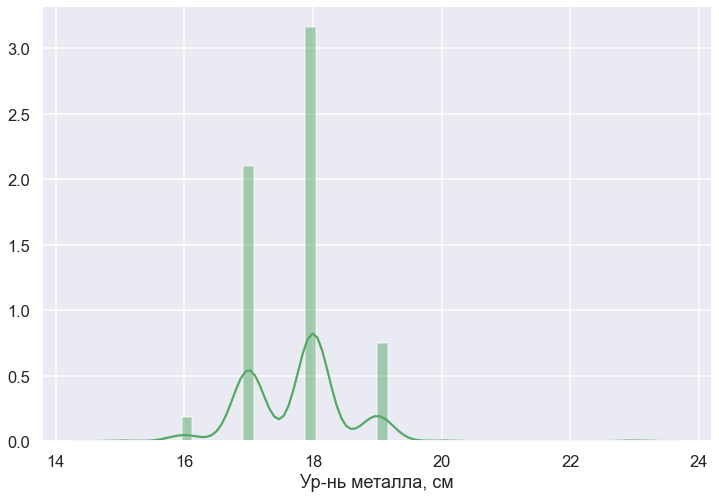

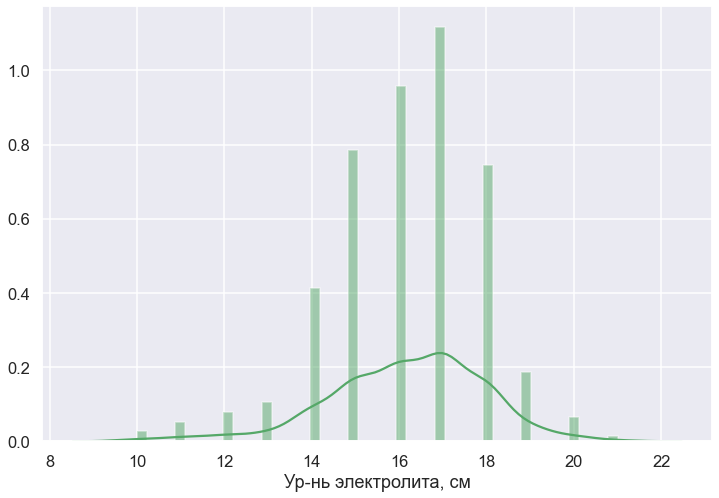

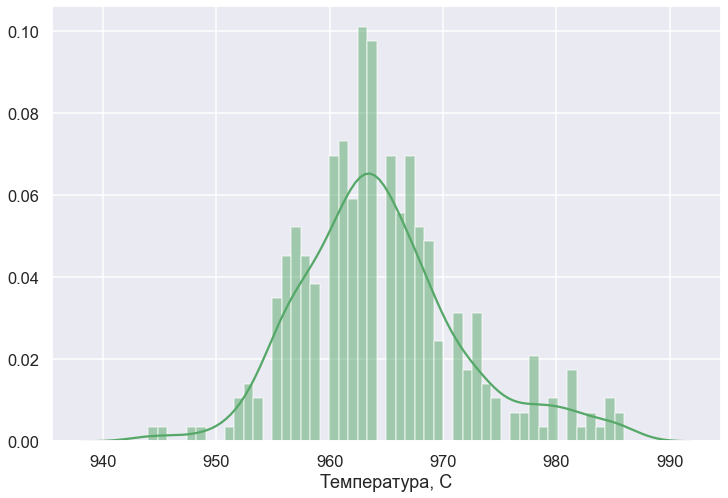

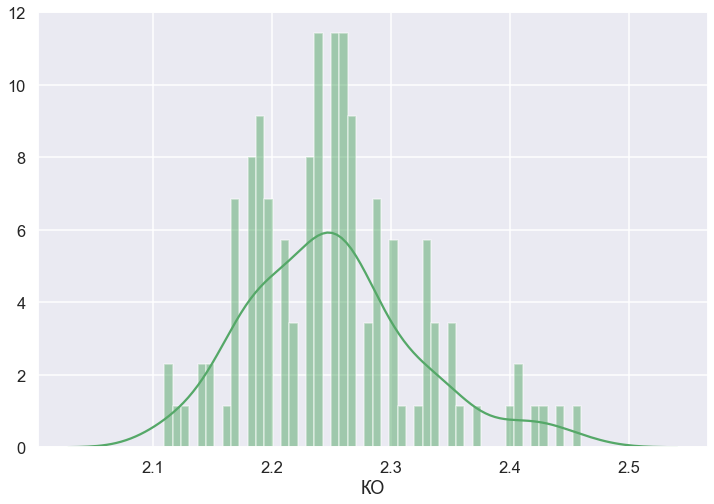

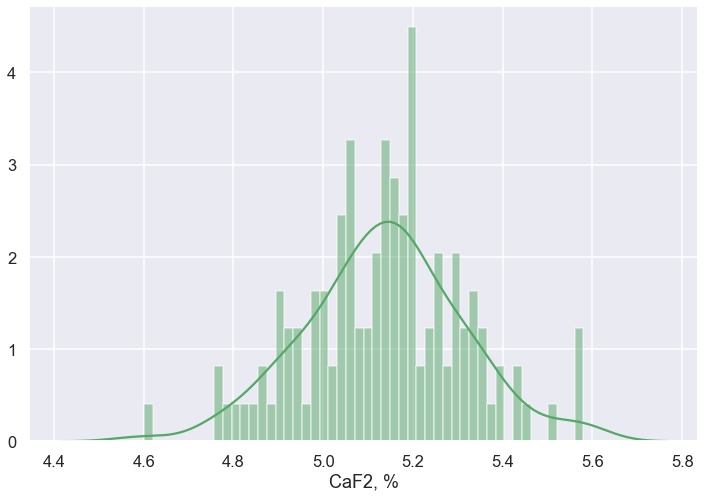

...

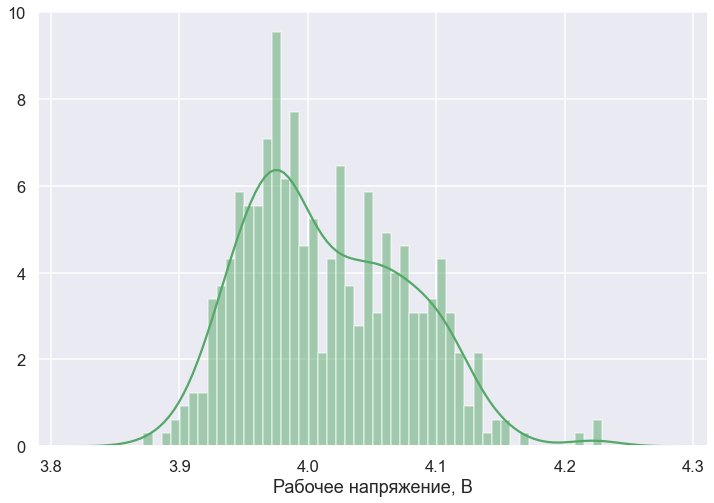

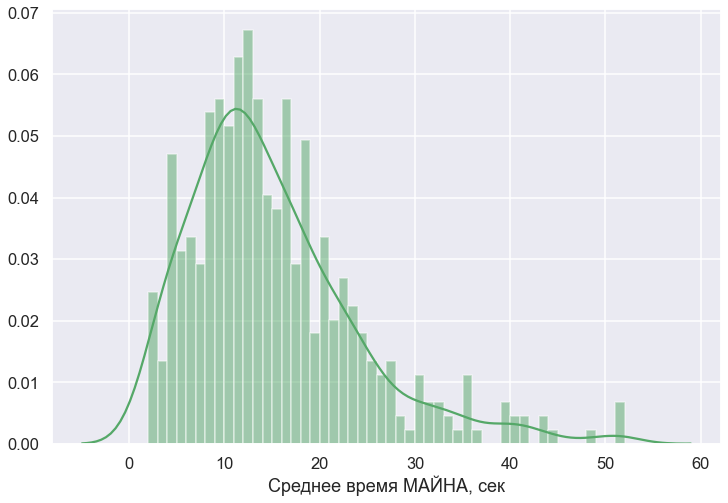

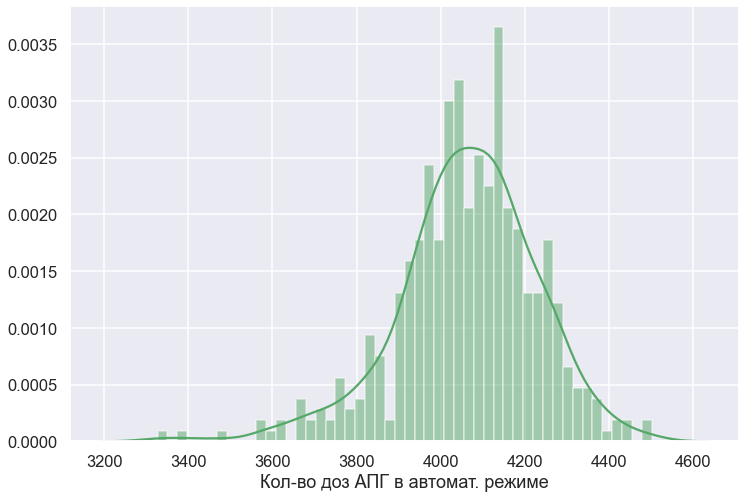

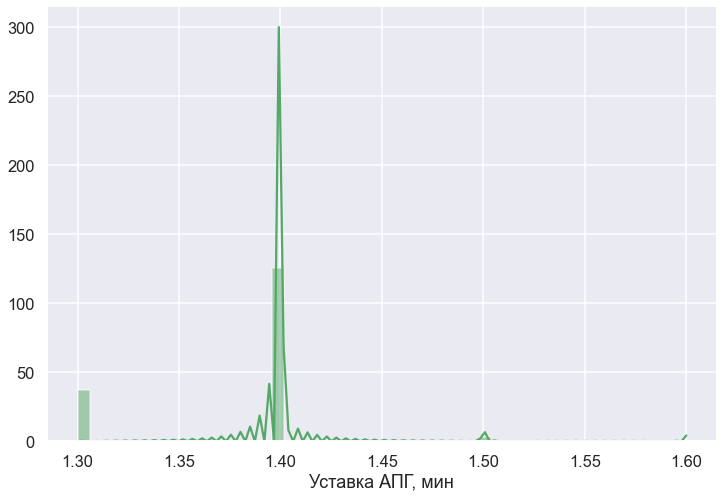

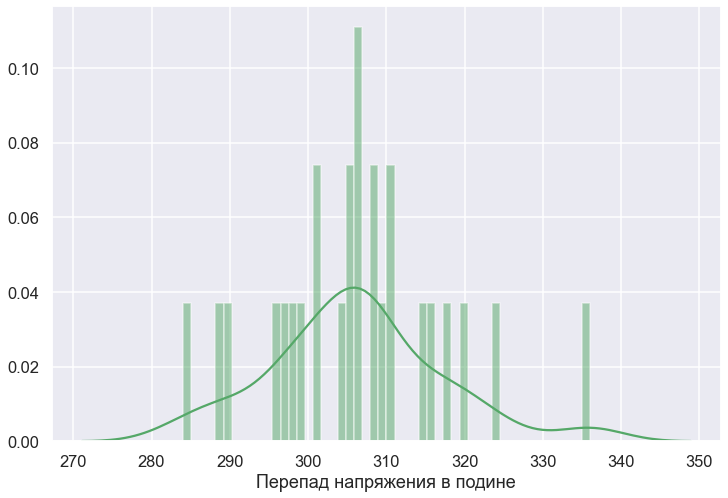

In [20]:
# draw distributions
for i in range(columnsNumber):
    drawHistograms(dataSingleUnit, columnNames[i],paramNames[i])


# нормализация данных

In [18]:
# normalize [0,1]
dataSingleUnitScaled=[]
for i in range(columnsNumber):
    scaler = preprocessing.MinMaxScaler()
    x_scaled = scaler.fit_transform(dataSingleUnit)
    dataSingleUnitScaled = pd.DataFrame(x_scaled)
dataSingleUnitScaled.columns=columnNames
dataSingleUnitScaled.head()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,0.25,0.363636,0.404762,0.257143,0.459184,0.592593,0.728291,0.78,0.639693,0.333333,NaN
1,0.25,0.545455,0.214286,NaN,NaN,0.222222,0.518207,0.04,0.800681,0.000000,NaN
2,NaN,NaN,NaN,NaN,NaN,0.296296,0.700280,0.36,0.683986,0.000000,NaN
3,0.25,0.272727,0.380952,NaN,NaN,0.296296,0.484594,0.62,0.219761,0.000000,NaN
4,0.25,0.818182,0.214286,0.200000,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,NaN


# анализ пропусков

In [22]:
# missing values analysis
analyzeMissingValues(dataSingleUnit)


Пропущенные данные (из 455 записей):
Metal          113
Electrolyte    113
Temp           113
KO             330
CAF2           330
Noise            0
Voltage          0
Mynah            9
Doze             0
APG              0
dVoltage       429
dtype: int64
Пропущенные данные, % (из 455 записей):
Metal          24.835165
Electrolyte    24.835165
Temp           24.835165
KO             72.527473
CAF2           72.527473
Noise           0.000000
Voltage         0.000000
Mynah           1.978022
Doze            0.000000
APG             0.000000
dVoltage       94.285714
dtype: float64


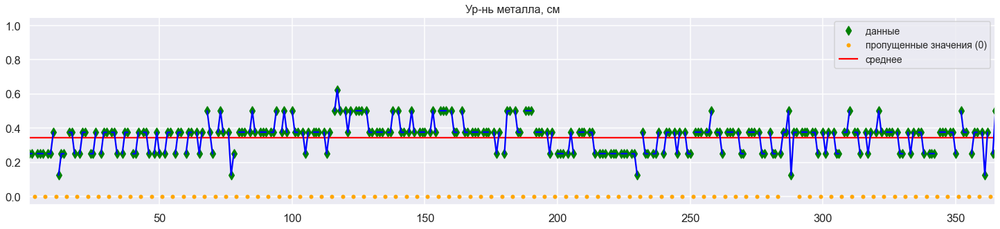

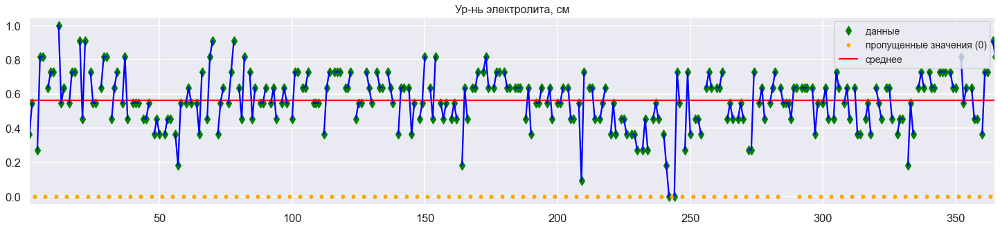

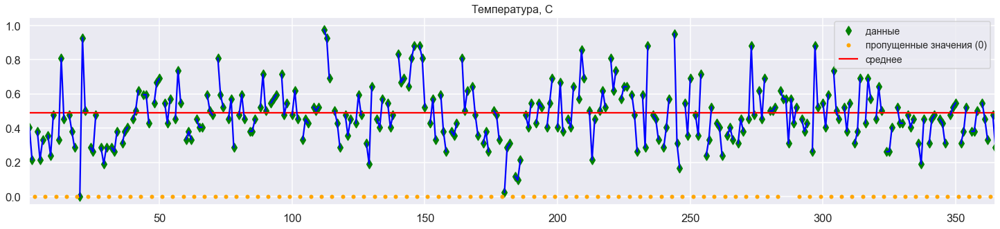

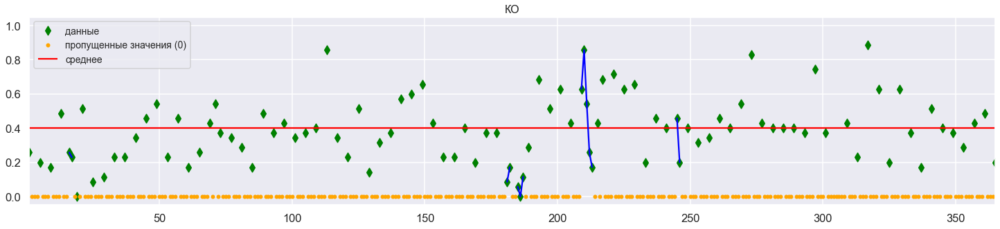

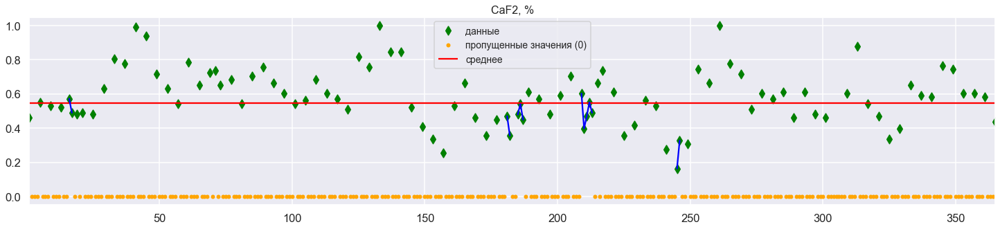

...

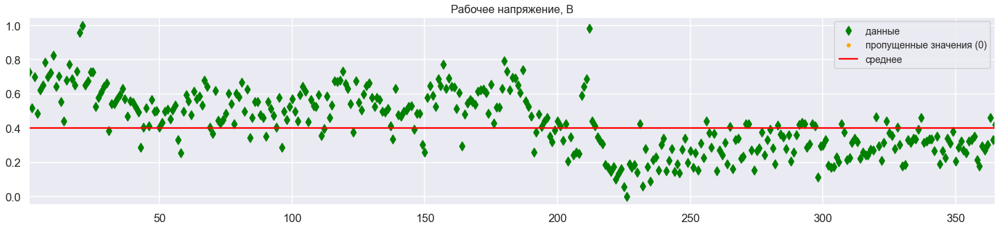

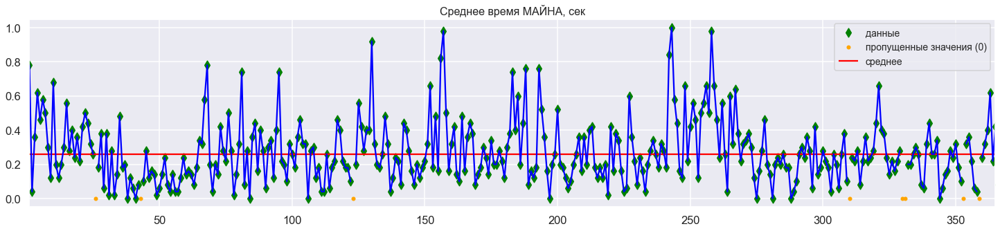

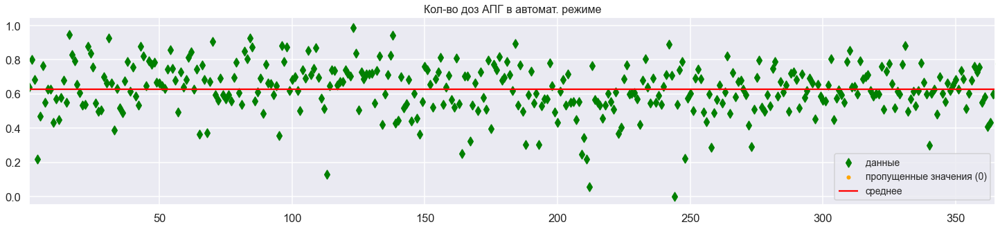

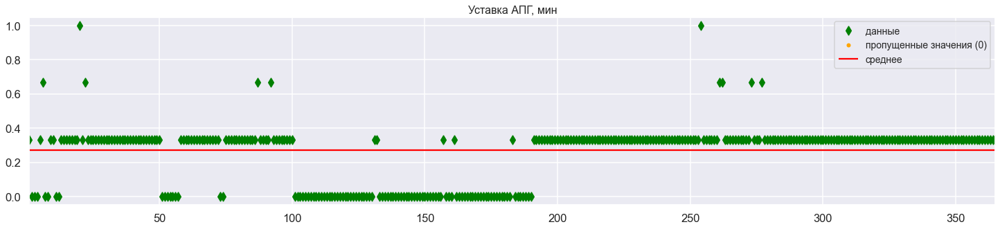

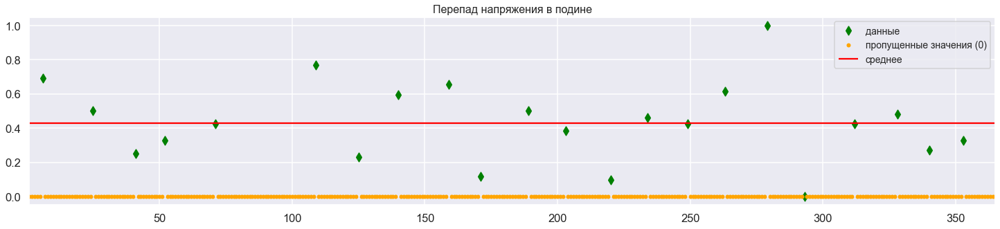

In [23]:
# plot data
for i in range(columnsNumber):
    drawColumnAsTimeSeries(dataSingleUnitScaled, columnNames[i], paramNames[i])


# Заполнение интерполяцией

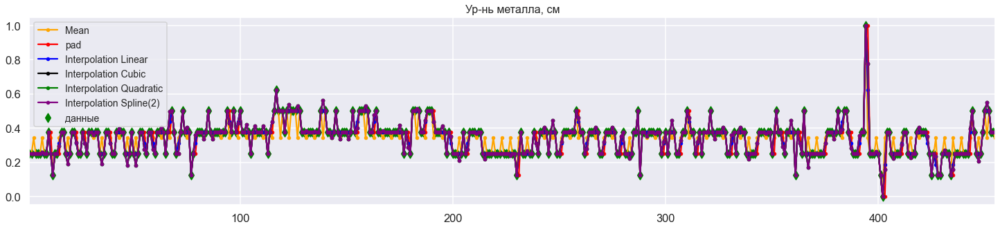

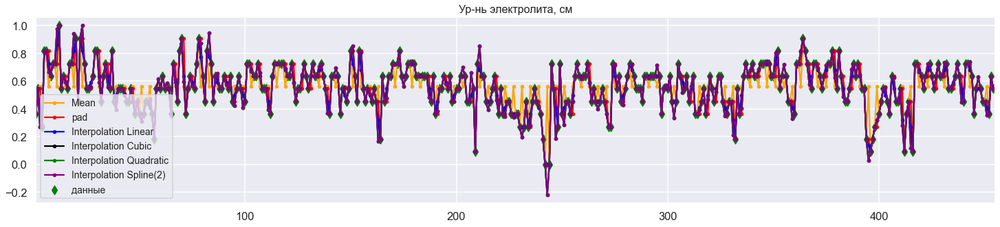

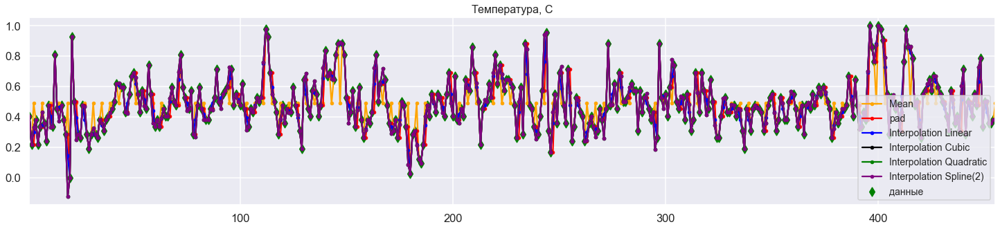

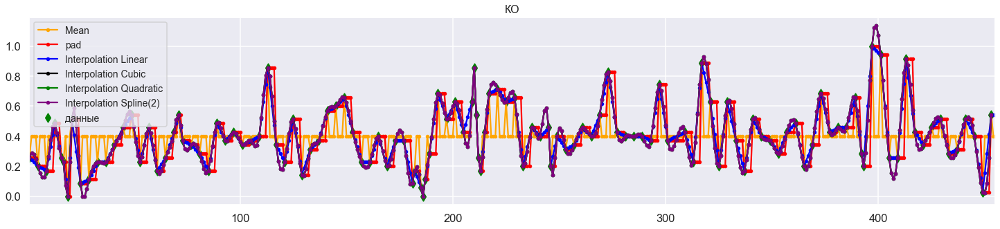

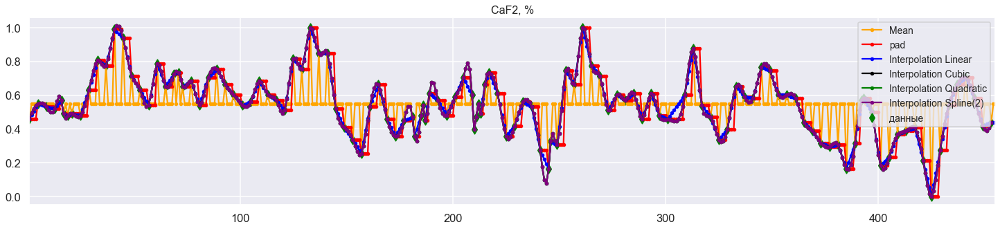

...

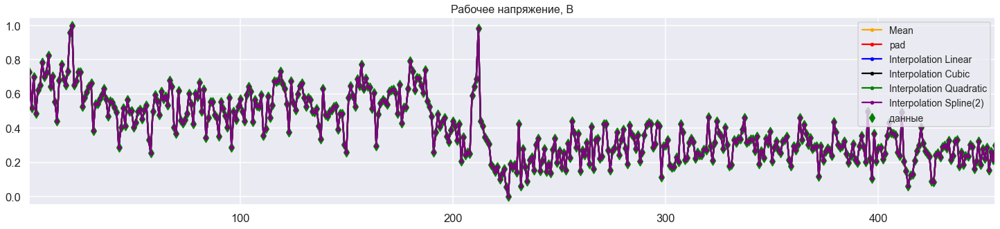

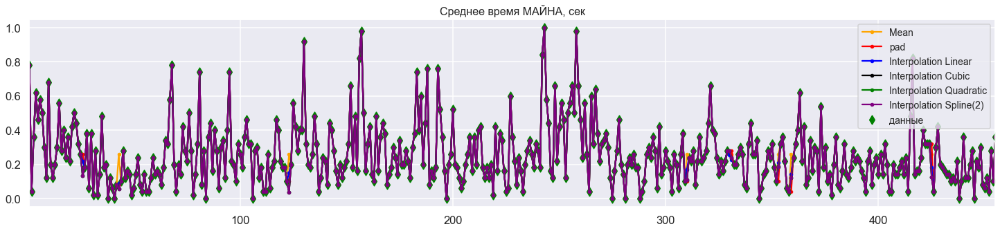

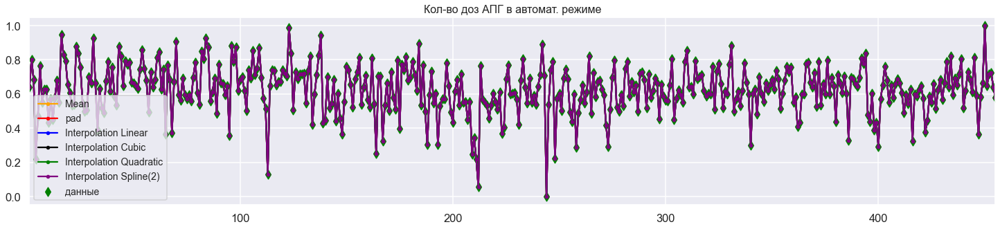

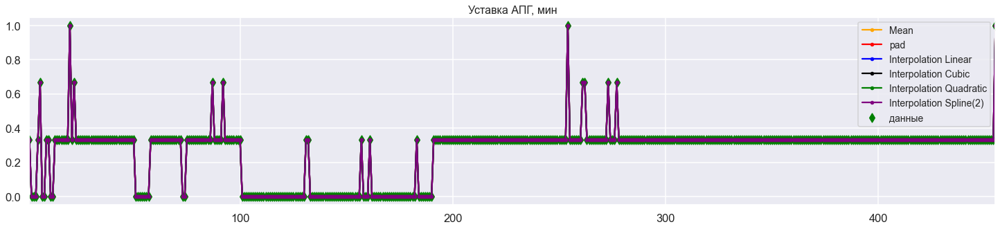

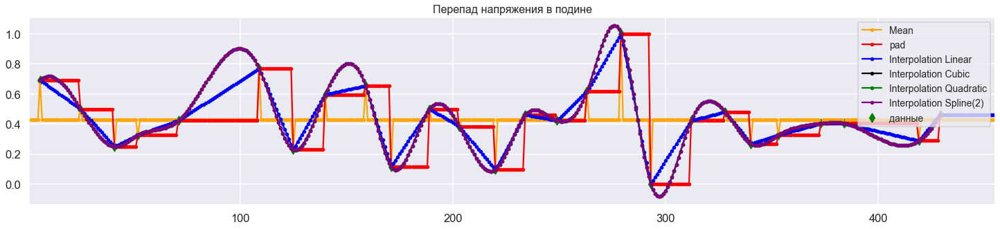

In [24]:
# plot data with interpolations
for i in range(columnsNumber):
    drawFillNan(dataSingleUnitScaled,columnNames[i],paramNames[i])


# Корреляционный анализ

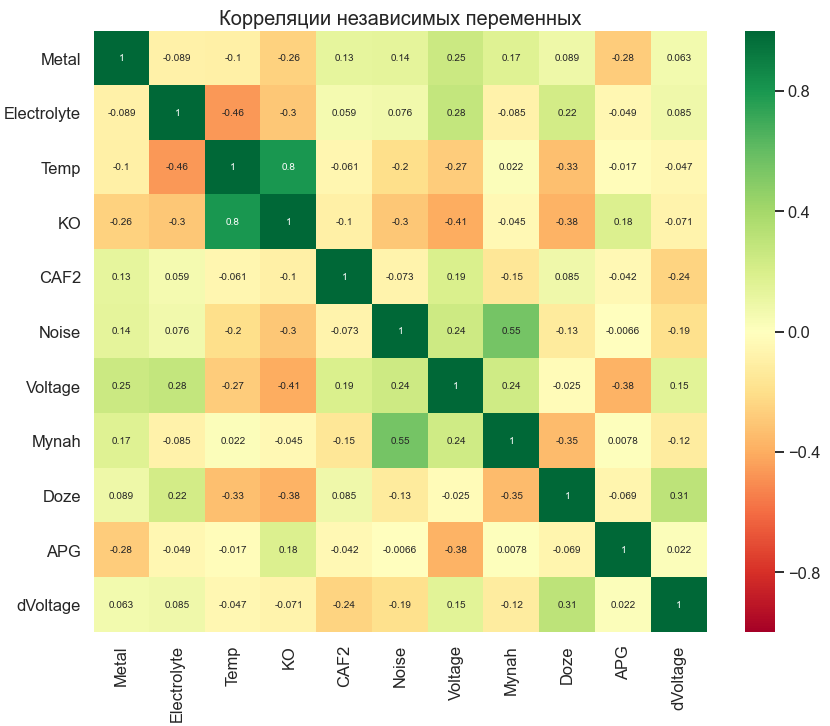

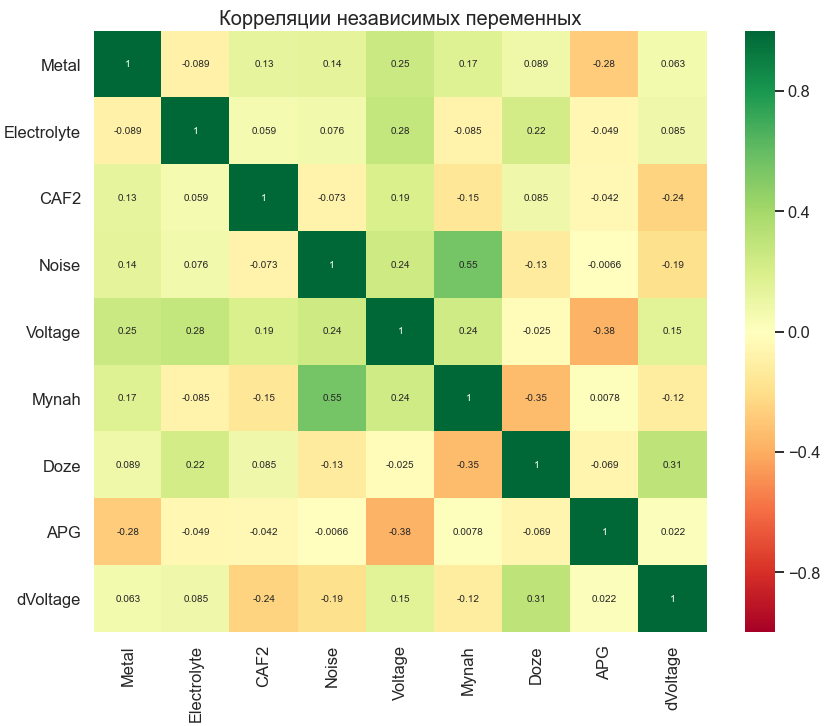

In [25]:
# plot correlation analysis
drawCorrMatrix(dataSingleUnit)
drawCorrMatrix(dataSingleUnit, ['Temp','KO'])


In [26]:
analyzeCorrWithTargets(dataSingleUnit,outputNames)


#################################################
###### Корреляция с целевыми переменными   ######
#################################################

Корреляция с переменной ' Temp ':


Mynah          0.022218
APG           -0.016779
dVoltage      -0.046982
CAF2          -0.060778
Metal         -0.100809
Noise         -0.202595
Voltage       -0.273572
Doze          -0.329548
Electrolyte   -0.462227
Name: Temp, dtype: float64

-------------------------------------------------
Корреляции больше заданного порога ( 0.3 ) с переменной Temp :


Doze          -0.329548
Electrolyte   -0.462227
Name: Temp, dtype: float64

-------------------------------------------------

Корреляция с переменной ' KO ':


APG            0.184961
Mynah         -0.045021
dVoltage      -0.071122
CAF2          -0.101537
Metal         -0.257075
Noise         -0.298604
Electrolyte   -0.299246
Doze          -0.378670
Voltage       -0.406063
Name: KO, dtype: float64

-------------------------------------------------
Корреляции больше заданного порога ( 0.3 ) с переменной KO :


Doze      -0.378670
Voltage   -0.406063
Name: KO, dtype: float64

-------------------------------------------------


# Графики парных зависимостей

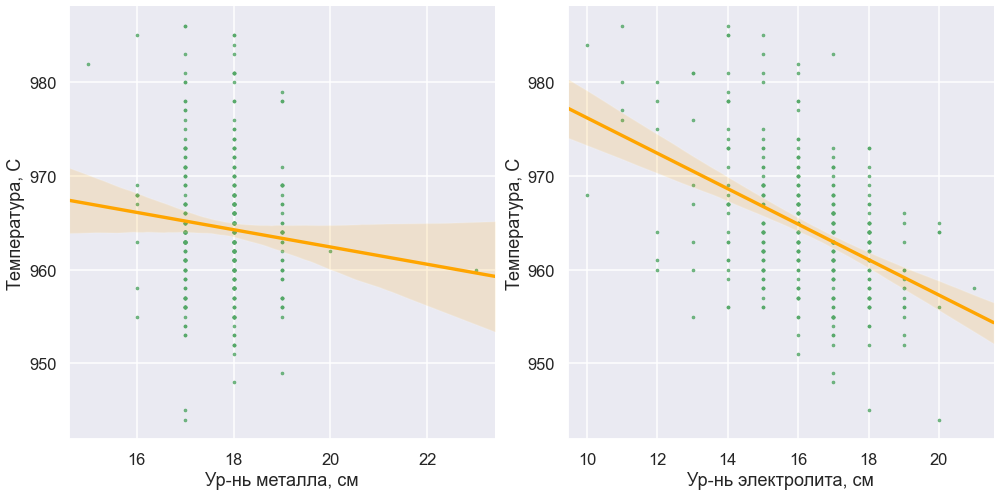

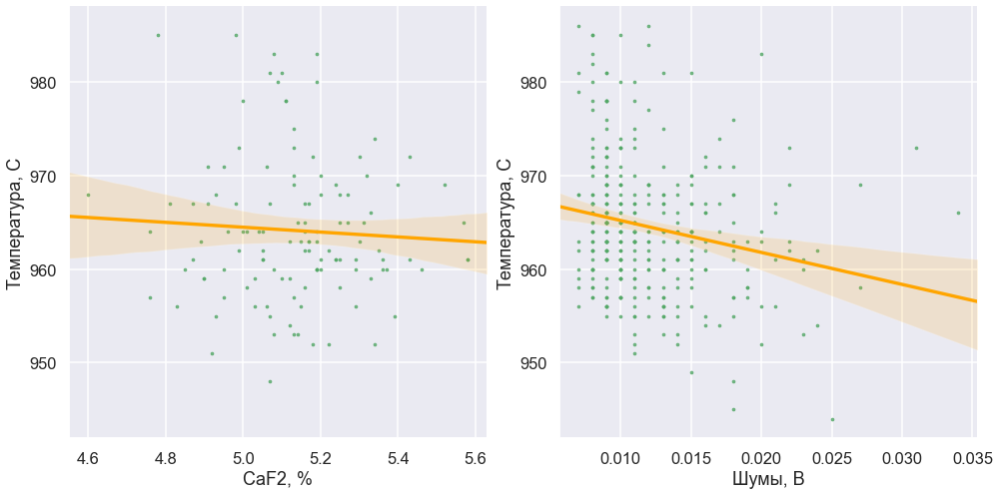

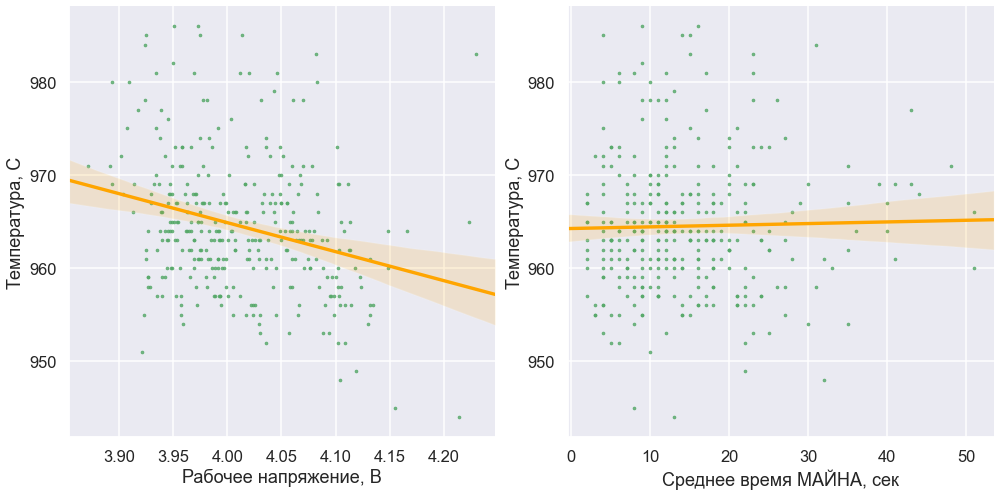

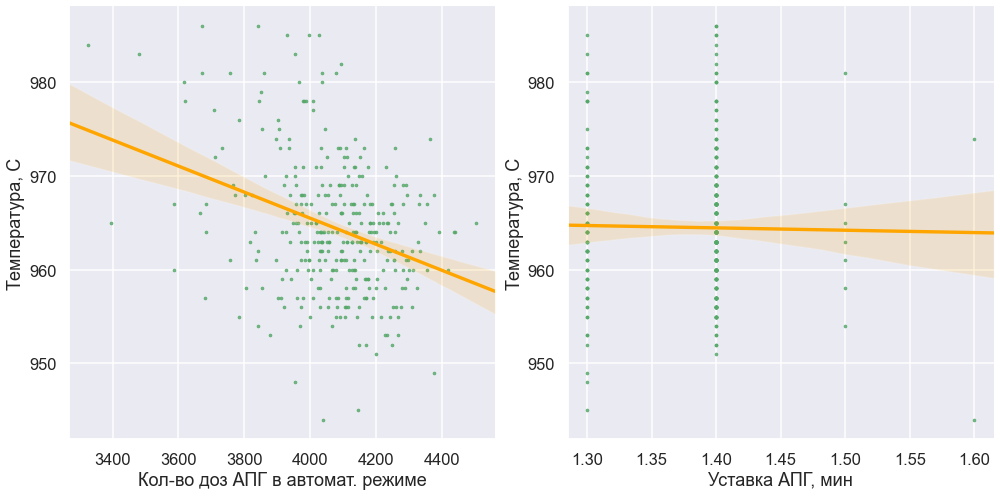

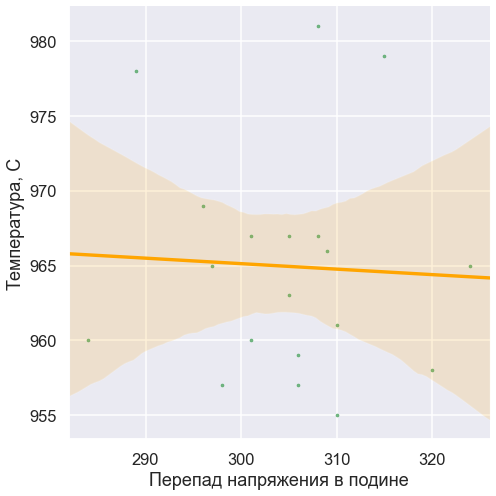

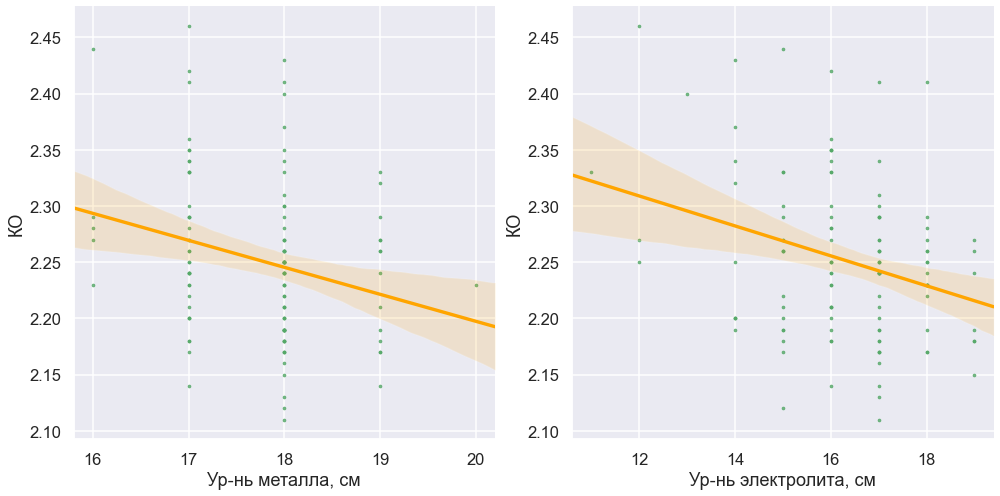

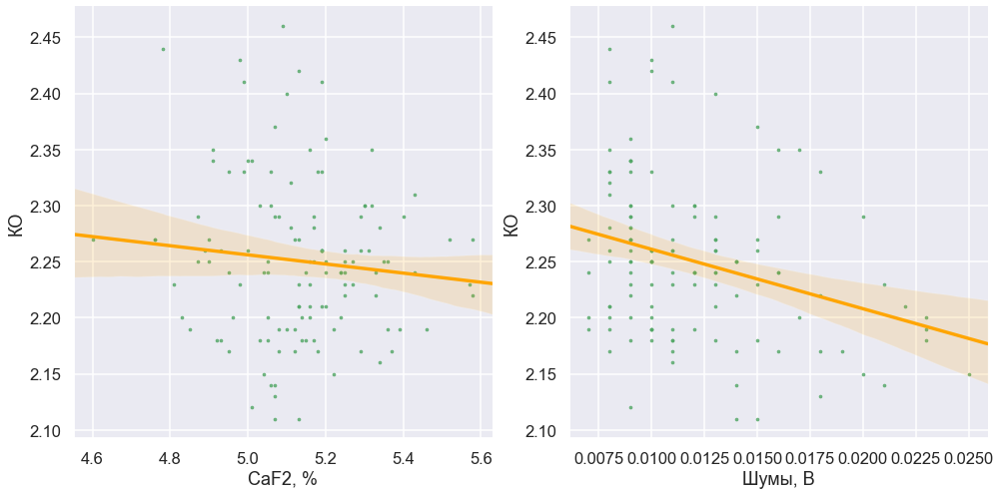

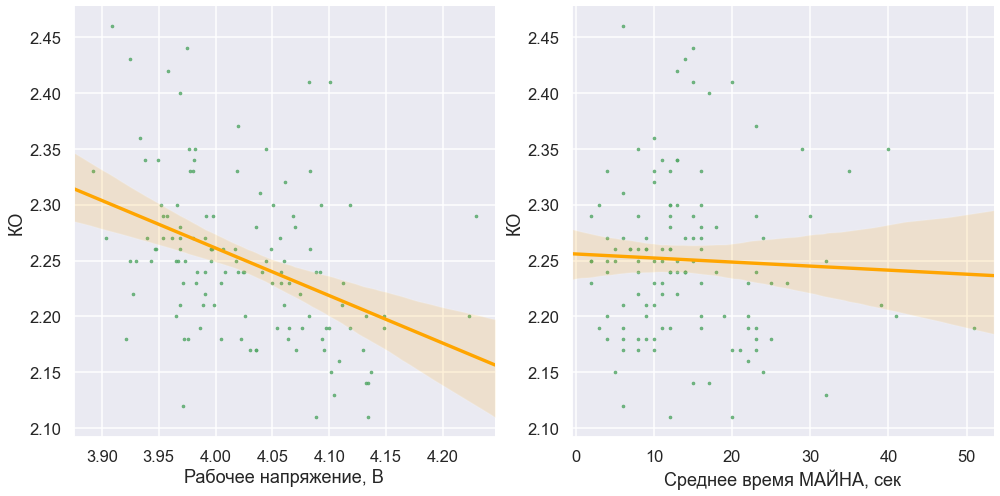

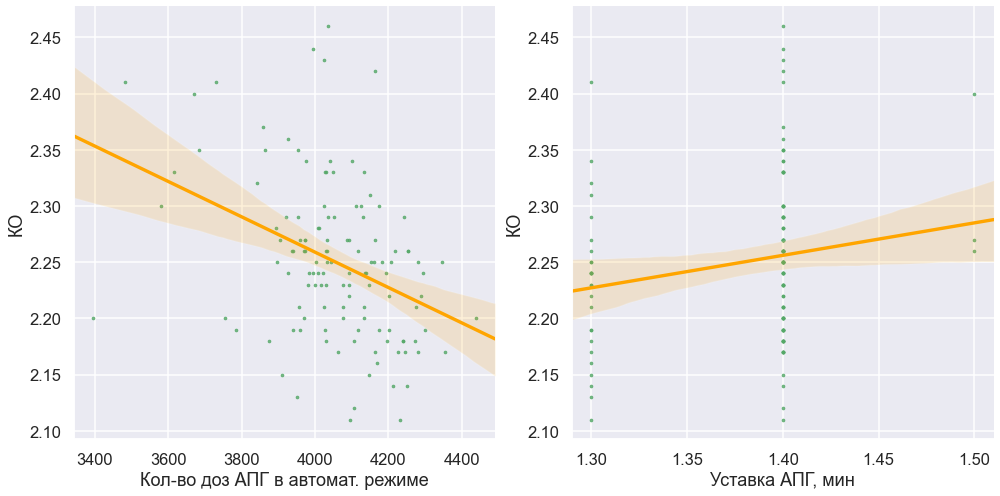

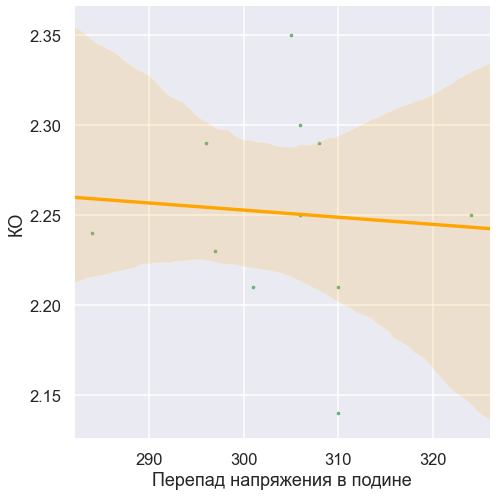

In [27]:
# pair plots
drawPairPlots(dataSingleUnit,inputNames, outputNames, paramNamesDictionary)


# Используем линейную интерполяцию для построения моделей

In [19]:
# lets use liniear interpolation for scalled data
for col in dataSingleUnitScaled.columns:
    if np.isnan(dataSingleUnitScaled.loc[0, col]):
        dataSingleUnitScaled.loc[0, col] = dataSingleUnitScaled[col].mean()
dataLineInterpol=dataSingleUnitScaled.interpolate(method='linear').copy()
dataLineInterpol.head()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,0.25,0.363636,0.404762,0.257143,0.459184,0.592593,0.728291,0.78,0.639693,0.333333,0.426775
1,0.25,0.545455,0.214286,0.242857,0.482143,0.222222,0.518207,0.04,0.800681,0.000000,0.479882
2,0.25,0.409091,0.297619,0.228571,0.505102,0.296296,0.700280,0.36,0.683986,0.000000,0.532988
3,0.25,0.272727,0.380952,0.214286,0.528061,0.296296,0.484594,0.62,0.219761,0.000000,0.586095
4,0.25,0.818182,0.214286,0.200000,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,0.639201


# сформируем набор y(t)=F(x(t),x(t-1),...,x(t-k))

In [53]:
lagK=1

newInputLen=len(inputNames)*(lagK+1)
dfLen=len(dataLineInterpol)
newDFLen=dfLen-lagK

outDF=dataLineInterpol.loc[lagK:,outputNames].copy().reset_index(drop=True)
dataLagK=dataLineInterpol.loc[:(dfLen-lagK-1),inputNames].copy().reset_index(drop=True)
dataLagK.columns = dataLagK.columns +'_T'
for k in range(lagK):
    sliceDF=dataLineInterpol.loc[k+1:(k+newDFLen),inputNames].copy().reset_index(drop=True)
    sliceDF.columns = sliceDF.columns+'_T_'+str(k+1)
    dataLagK=pd.concat([dataLagK, sliceDF],axis=1, join='outer', copy=True)
dataLagK=pd.concat([dataLagK, outDF],axis=1, join='outer', copy=True)
display(dataLagK.head())
display(dataLagK.tail())
display(dataLagK.info())

,Metal_T,Electrolyte_T,CAF2_T,Noise_T,Voltage_T,Mynah_T,Doze_T,APG_T,dVoltage_T,Metal_T_1,Electrolyte_T_1,CAF2_T_1,Noise_T_1,Voltage_T_1,Mynah_T_1,Doze_T_1,APG_T_1,dVoltage_T_1,Temp,KO
0,0.25,0.363636,0.459184,0.592593,0.728291,0.78,0.639693,0.333333,0.426775,0.25,0.545455,0.482143,0.222222,0.518207,0.04,0.800681,0.000000,0.479882,0.214286,0.242857
1,0.25,0.545455,0.482143,0.222222,0.518207,0.04,0.800681,0.000000,0.479882,0.25,0.409091,0.505102,0.296296,0.700280,0.36,0.683986,0.000000,0.532988,0.297619,0.228571
2,0.25,0.409091,0.505102,0.296296,0.700280,0.36,0.683986,0.000000,0.532988,0.25,0.272727,0.528061,0.296296,0.484594,0.62,0.219761,0.000000,0.586095,0.380952,0.214286
3,0.25,0.272727,0.528061,0.296296,0.484594,0.62,0.219761,0.000000,0.586095,0.25,0.818182,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,0.639201,0.214286,0.200000
4,0.25,0.818182,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,0.639201,0.25,0.818182,0.545918,0.259259,0.652661,0.58,0.764906,0.666667,0.692308,0.333333,0.192857


,Metal_T,Electrolyte_T,CAF2_T,Noise_T,Voltage_T,Mynah_T,Doze_T,APG_T,dVoltage_T,Metal_T_1,Electrolyte_T_1,CAF2_T_1,Noise_T_1,Voltage_T_1,Mynah_T_1,Doze_T_1,APG_T_1,dVoltage_T_1,Temp,KO
449,0.500,0.454545,0.423469,0.074074,0.221289,0.06,1.000000,0.333333,0.461538,0.500,0.409091,0.428571,0.037037,0.288515,0.12,0.649063,0.333333,0.461538,0.428571,0.285714
450,0.500,0.409091,0.428571,0.037037,0.288515,0.12,0.649063,0.333333,0.461538,0.500,0.363636,0.433673,0.074074,0.154062,0.04,0.718058,0.333333,0.461538,0.357143,0.414286
451,0.500,0.363636,0.433673,0.074074,0.154062,0.04,0.718058,0.333333,0.461538,0.375,0.636364,0.438776,0.148148,0.263305,0.28,0.722317,0.333333,0.461538,0.357143,0.542857
452,0.375,0.636364,0.438776,0.148148,0.263305,0.28,0.722317,0.333333,0.461538,0.375,0.545455,0.438776,0.000000,0.215686,0.10,0.639693,0.333333,0.461538,0.380952,0.542857
453,0.375,0.545455,0.438776,0.000000,0.215686,0.10,0.639693,0.333333,0.461538,0.375,0.545455,0.438776,0.000000,0.299720,0.36,0.577513,1.000000,0.461538,0.380952,0.542857


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454 entries, 0 to 453
Data columns (total 20 columns):
Metal_T            454 non-null float64
Electrolyte_T      454 non-null float64
CAF2_T             454 non-null float64
Noise_T            454 non-null float64
Voltage_T          454 non-null float64
Mynah_T            454 non-null float64
Doze_T             454 non-null float64
APG_T              454 non-null float64
dVoltage_T         454 non-null float64
Metal_T_1          454 non-null float64
Electrolyte_T_1    454 non-null float64
CAF2_T_1           454 non-null float64
Noise_T_1          454 non-null float64
Voltage_T_1        454 non-null float64
Mynah_T_1          454 non-null float64
Doze_T_1           454 non-null float64
APG_T_1            454 non-null float64
dVoltage_T_1       454 non-null float64
Temp               454 non-null float64
KO                 454 non-null float64
dtypes: float64(20)
memory usage: 71.1 KB


None

In [59]:
inputNames = dataLagK.columns.drop(outputNames).values

# МГК

In [60]:
# PCA plots
pca1=PCA()
pcaData1=pca1.fit_transform(dataLagK[inputNames])
print(np.array_str(pca1.explained_variance_ratio_*100, precision=2, suppress_small=True))


[21.55 15.59 11.9  10.21  8.91  7.5   4.68  4.22  3.11  2.61  2.31  1.93
  1.88  1.5   1.12  0.74  0.19  0.04]


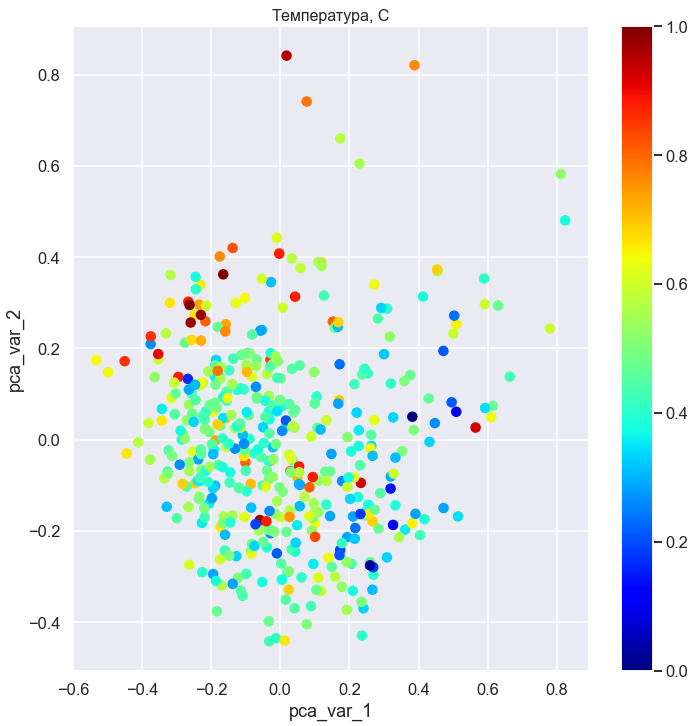

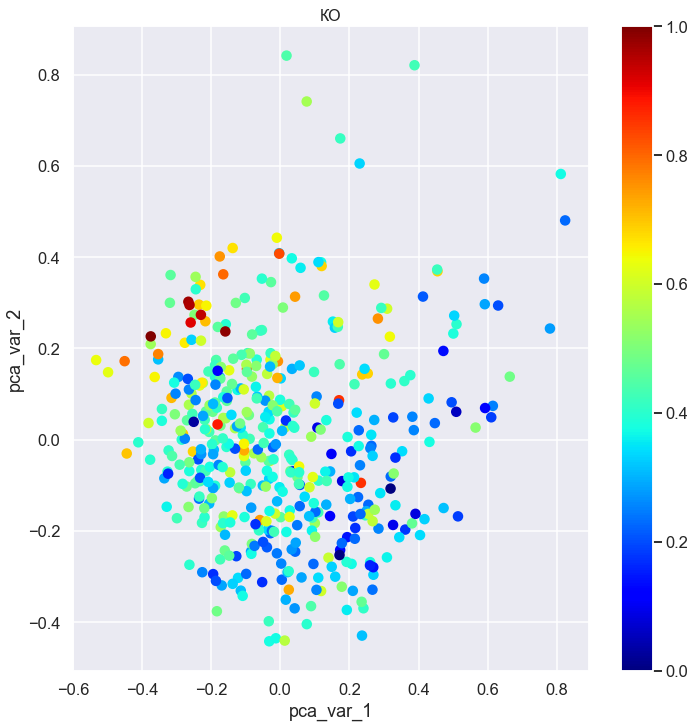

In [30]:
# draw flat pca plot
drawPCAFlatPlot(pcaData1,dataLineInterpol,outputNames,paramNamesDictionary)


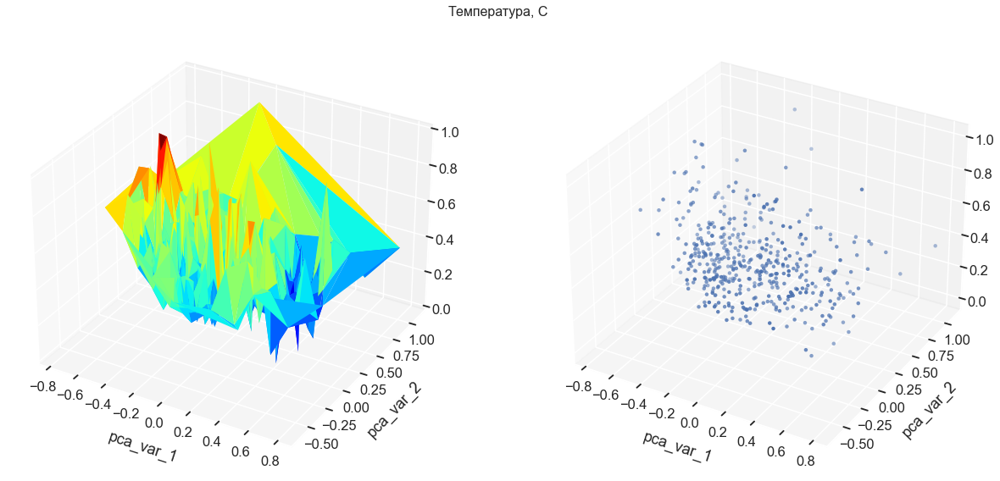

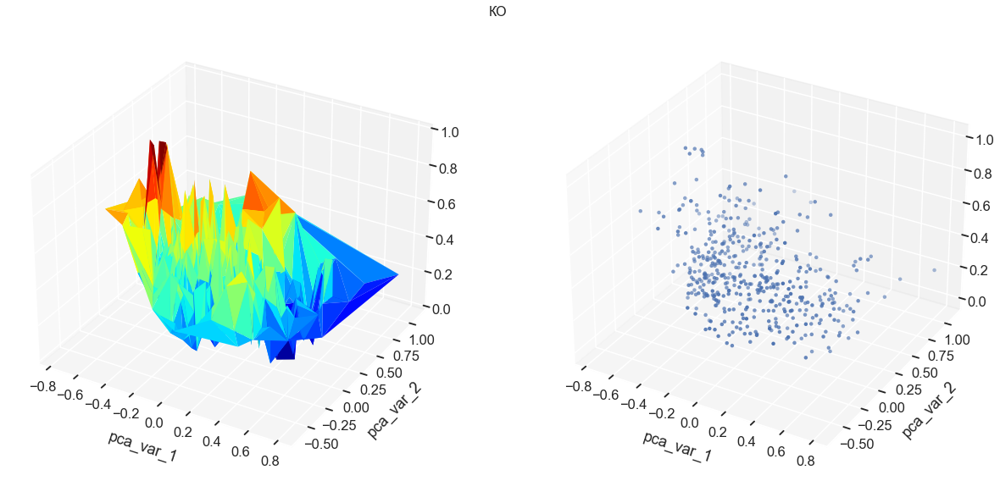

In [42]:
# draw flat pca plot
drawPCA3DPlot(pcaData1,dataLagK,outputNames,paramNamesDictionary)


# Построение линейной модели

In [43]:
# lin models for TEMP with inputs excluding 2nd out
rezults1=analyzeLinModels(dataLagK,inputNames, outputNames[0])
rezults1


,best,mean,std,median,worst
mse,0.109184,0.130210,0.010813,0.127197,0.161759
r2Score,0.479166,0.336066,0.081945,0.342589,0.122810
mae,0.087738,0.102543,0.008033,0.101111,0.127686


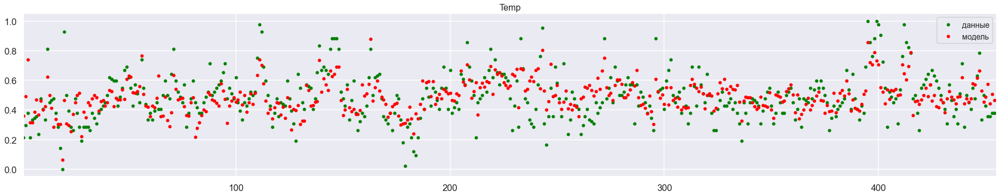

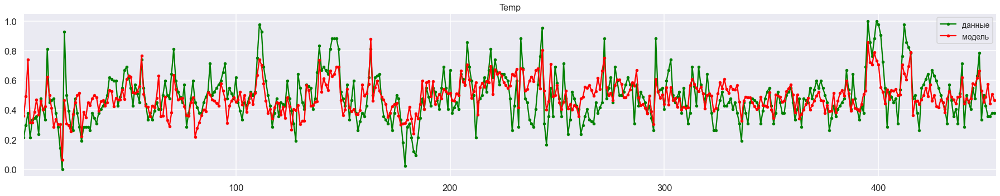

{'mse': 0.12329487245112018, 'r2score': 0.4233618152417913, 'mae': 0.09746253756416162}


,Переменная,Coefficients
0,Metal_T,0.028089
1,Electrolyte_T,0.045224
2,CAF2_T,0.502733
3,Noise_T,0.062779
4,Voltage_T,0.119413
5,Mynah_T,-0.183542
6,Doze_T,-0.197790
7,APG_T,-0.014499
8,dVoltage_T,0.502693
9,Metal_T_1,-0.164206


In [44]:
modelPErformance1, coef1 = buildLinModels(dataLagK,inputNames, outputNames[0], drawRez=True)
print(modelPErformance1)
coef1


In [62]:
# lin models for TEMP with inputs including 2nd out
inCols=inputNames.copy().tolist()
inCols.append(outputNames[1])
rezults2=analyzeLinModels(dataLagK, inCols, outputNames[0])
rezults2


,best,mean,std,median,worst
mse,0.096547,0.113542,0.007416,0.114670,0.130740
r2Score,0.668177,0.505049,0.080091,0.506628,0.347392
mae,0.076660,0.087992,0.006273,0.088120,0.104627


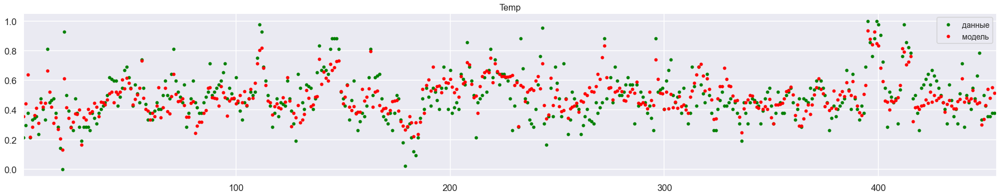

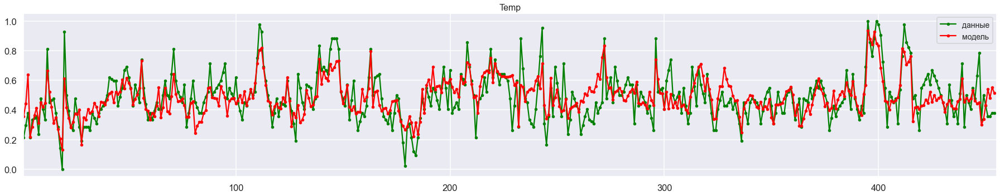

{'mse': 0.1081724035939289, 'r2score': 0.5561396756440609, 'mae': 0.08405829539300218}


,Переменная,Coefficients
0,Metal_T,0.011592
1,Electrolyte_T,0.064914
2,CAF2_T,0.097789
3,Noise_T,0.043682
4,Voltage_T,0.234911
5,Mynah_T,-0.135797
6,Doze_T,-0.079797
7,APG_T,-0.003244
8,dVoltage_T,0.418608
9,Metal_T_1,-0.109725


In [63]:
modelPErformance2, coef2 = buildLinModels(dataLagK ,inCols, outputNames[0], drawRez=True)
print(modelPErformance2)
coef2


In [64]:
# lin models for KO with inputs excluding 2nd out
rezults3=analyzeLinModels(dataLagK, inputNames, outputNames[1])
rezults3


,best,mean,std,median,worst
mse,0.122064,0.135343,0.008858,0.134498,0.160193
r2Score,0.476700,0.347067,0.089834,0.362385,0.087187
mae,0.097014,0.106640,0.006222,0.106376,0.125222


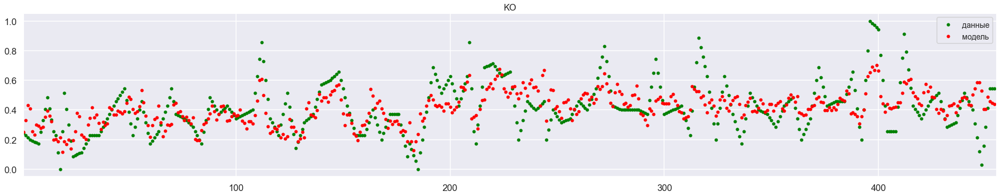

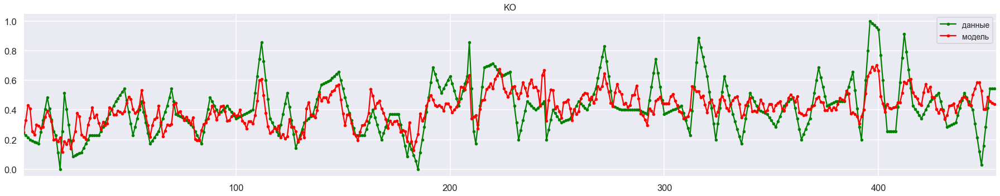

{'mse': 0.12879358383665215, 'r2score': 0.4088581262103784, 'mae': 0.10138692815032513}


,Переменная,Coefficients
0,Metal_T,0.035913
1,Electrolyte_T,-0.042862
2,CAF2_T,0.881521
3,Noise_T,0.041572
4,Voltage_T,-0.251428
5,Mynah_T,-0.103935
6,Doze_T,-0.256859
7,APG_T,-0.024501
8,dVoltage_T,0.183043
9,Metal_T_1,-0.118598


In [65]:
modelPErformance3, coef3 = buildLinModels(dataLagK,inputNames, outputNames[1], drawRez=True)
print(modelPErformance3)
coef3


In [66]:
# lin models for KO with inputs including 2nd out
inCols=inputNames.copy().tolist()
inCols.append(outputNames[0])
rezults4=analyzeLinModels(dataLagK, inCols, outputNames[1])
rezults4


,best,mean,std,median,worst
mse,0.102642,0.117765,0.006725,0.117581,0.132630
r2Score,0.607346,0.498027,0.065507,0.493051,0.248101
mae,0.080653,0.090607,0.005165,0.089940,0.103039


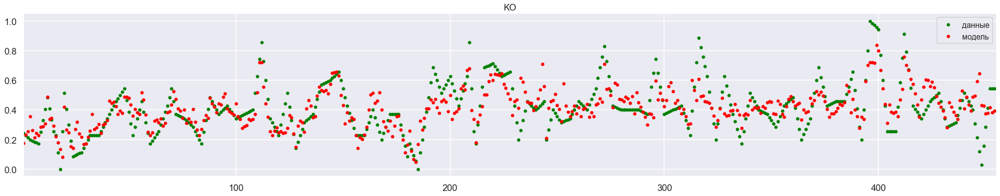

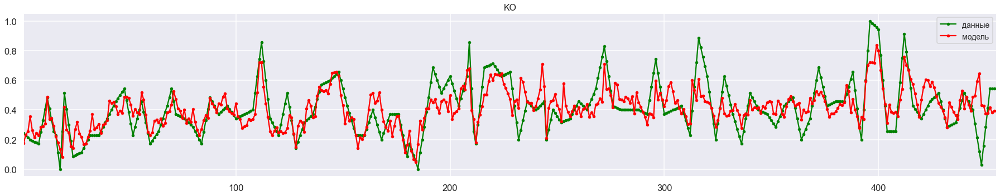

{'mse': 0.11299668229601448, 'r2score': 0.5449756350237889, 'mae': 0.08602610939542911}


,Переменная,Coefficients
0,Metal_T,0.021833
1,Electrolyte_T,-0.065531
2,CAF2_T,0.629523
3,Noise_T,0.010104
4,Voltage_T,-0.311285
5,Mynah_T,-0.011933
6,Doze_T,-0.157715
7,APG_T,-0.017233
8,dVoltage_T,-0.068935
9,Metal_T_1,-0.036289


In [67]:
modelPErformance4, coef4 = buildLinModels(dataLagK,inCols, outputNames[1], drawRez=True)
print(modelPErformance4)
coef4


# Построение нелинейной модели (SVR)

In [68]:
# SVR models for TEMP with inputs excluding 2nd out
rezults1_=analyzeSVRModels(dataLagK, inputNames, outputNames[0])
rezults1_


--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.107174,0.123359,0.007782,0.122801,0.138604
r2Score,0.574329,0.397634,0.077057,0.402625,0.238120
mae,0.082953,0.095051,0.006316,0.095620,0.106349


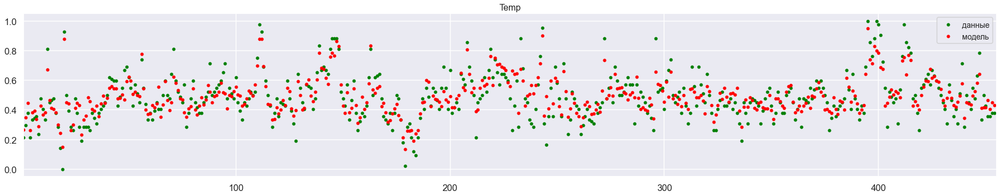

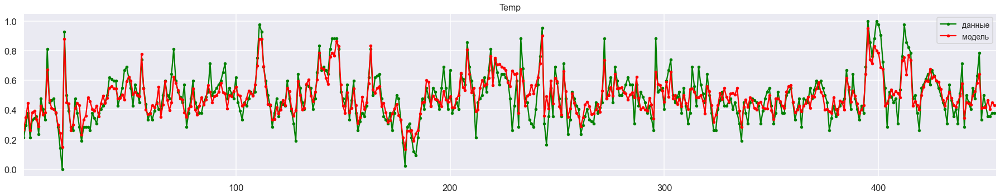

{'mse': 0.08220460786785994, 'r2score': 0.7436663093280065, 'mae': 0.06346527343335072}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.05, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [69]:
modelPErformance1_, coef1_ = buildSVRModels(dataLagK, inputNames, outputNames[0], drawRez=True)
print(modelPErformance1_)
coef1_


In [70]:
# SVR models for TEMP with inputs including 2nd out
inCols=inputNames.copy().tolist()
inCols.append(outputNames[1])
rezults2_=analyzeSVRModels(dataLagK,inCols, outputNames[0])
rezults2_


--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.097912,0.115187,0.008767,0.116334,0.131173
r2Score,0.629705,0.491142,0.083860,0.501703,0.187630
mae,0.075848,0.089023,0.006315,0.088918,0.100363


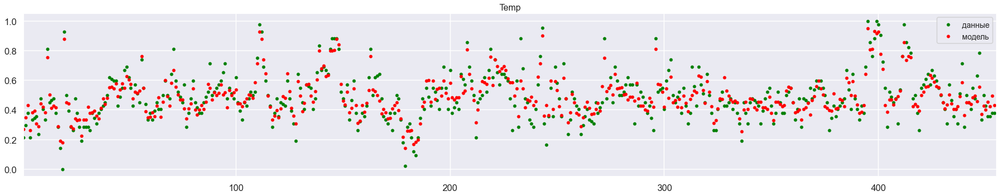

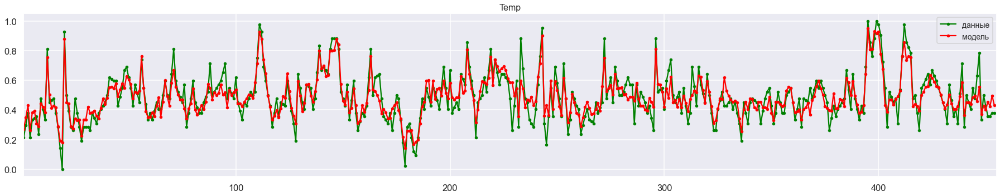

{'mse': 0.07083209534181202, 'r2score': 0.8096847696719132, 'mae': 0.05592400587632819}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.05, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [71]:
modelPErformance2_, coef2_ = buildSVRModels(dataLagK,inCols, outputNames[0], drawRez=True)
print(modelPErformance2_)
coef2_

In [72]:
# SVR models for KO  with inputs excluding 2nd out
rezults3_=analyzeSVRModels(dataLagK,inputNames, outputNames[1])
rezults3_

--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.116498,0.133457,0.008786,0.134206,0.147378
r2Score,0.498318,0.347767,0.094827,0.358155,0.059589
mae,0.088569,0.102651,0.006551,0.103424,0.113872


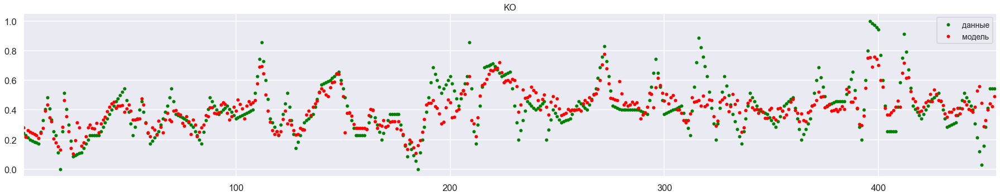

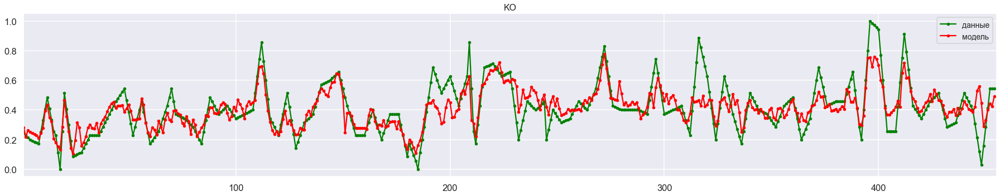

{'mse': 0.09713097377163948, 'r2score': 0.6637837088916692, 'mae': 0.07123253975598232}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.05, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [73]:
modelPErformance3_, coef3_ = buildSVRModels(dataLagK,inputNames, outputNames[1], drawRez=True)
print(modelPErformance3_)
coef3_

In [74]:
inCols=inputNames.copy().tolist()
inCols.append(outputNames[0])
rezults4_=analyzeSVRModels(dataLagK,inCols, outputNames[1])
rezults4_

--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.089776,0.117608,0.010489,0.117010,0.146547
r2Score,0.671493,0.499026,0.083071,0.510478,0.284566
mae,0.071963,0.088965,0.007686,0.088068,0.110451


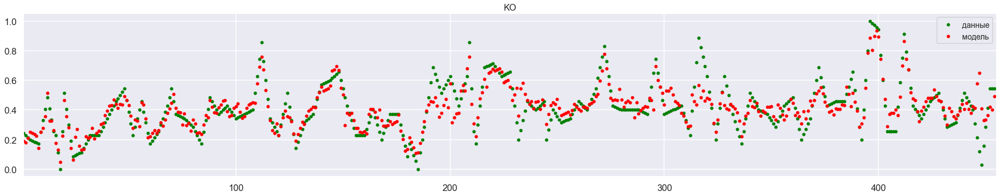

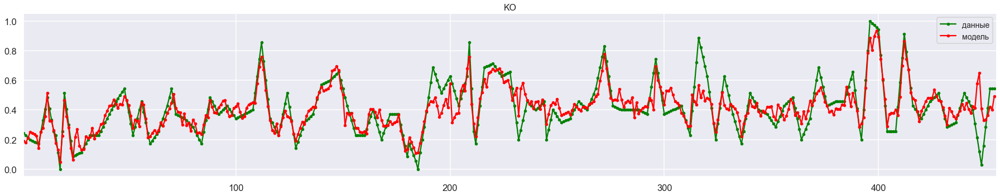

{'mse': 0.0851080453240613, 'r2score': 0.7418664227302973, 'mae': 0.06116664446984868}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.05, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [75]:
modelPErformance4_, coef4_ = buildSVRModels(dataLagK,inCols, outputNames[1], drawRez=True)
print(modelPErformance4_)
coef4_

# Итоговые сравнения

In [76]:
mtrxNames=['mse','r2Score','mae']

for name in mtrxNames:
    print('Результаты для',paramNamesDictionary[outputNames[0]],'мера',name,':')
    display(pd.DataFrame( {
                        'линейная регрессия (только входы)': rezults1.T[name],
                        'линейная регрессия (входы + КО)': rezults2.T[name],
                        'SVR (только входы)': rezults1_.T[name],
                        'SVR (входы + КО)': rezults2_.T[name],
                      } ).T )
    print('')

Результаты для Температура, С мера mse :


,best,mean,std,median,worst
линейная регрессия (только входы),0.109184,0.130210,0.010813,0.127197,0.161759
линейная регрессия (входы + КО),0.096547,0.113542,0.007416,0.114670,0.130740
SVR (только входы),0.107174,0.123359,0.007782,0.122801,0.138604
SVR (входы + КО),0.097912,0.115187,0.008767,0.116334,0.131173



Результаты для Температура, С мера r2Score :


,best,mean,std,median,worst
линейная регрессия (только входы),0.479166,0.336066,0.081945,0.342589,0.122810
линейная регрессия (входы + КО),0.668177,0.505049,0.080091,0.506628,0.347392
SVR (только входы),0.574329,0.397634,0.077057,0.402625,0.238120
SVR (входы + КО),0.629705,0.491142,0.083860,0.501703,0.187630



Результаты для Температура, С мера mae :


,best,mean,std,median,worst
линейная регрессия (только входы),0.087738,0.102543,0.008033,0.101111,0.127686
линейная регрессия (входы + КО),0.076660,0.087992,0.006273,0.088120,0.104627
SVR (только входы),0.082953,0.095051,0.006316,0.095620,0.106349
SVR (входы + КО),0.075848,0.089023,0.006315,0.088918,0.100363


In [77]:
mtrxNames=['mse','r2Score','mae']
for name in mtrxNames:
    print('Результаты для',paramNamesDictionary[outputNames[1]],'мера',name,':')
    display(pd.DataFrame( {
                        'линейная регрессия (только входы)': rezults3.T[name],
                        'линейная регрессия (входы + КО)': rezults4.T[name],
                        'SVR (только входы)': rezults3_.T[name],
                        'SVR (входы + КО)': rezults4_.T[name],
                      } ).T )
    print('')

Результаты для КО мера mse :


,best,mean,std,median,worst
линейная регрессия (только входы),0.122064,0.135343,0.008858,0.134498,0.160193
линейная регрессия (входы + КО),0.102642,0.117765,0.006725,0.117581,0.132630
SVR (только входы),0.116498,0.133457,0.008786,0.134206,0.147378
SVR (входы + КО),0.089776,0.117608,0.010489,0.117010,0.146547



Результаты для КО мера r2Score :


,best,mean,std,median,worst
линейная регрессия (только входы),0.476700,0.347067,0.089834,0.362385,0.087187
линейная регрессия (входы + КО),0.607346,0.498027,0.065507,0.493051,0.248101
SVR (только входы),0.498318,0.347767,0.094827,0.358155,0.059589
SVR (входы + КО),0.671493,0.499026,0.083071,0.510478,0.284566



Результаты для КО мера mae :


,best,mean,std,median,worst
линейная регрессия (только входы),0.097014,0.106640,0.006222,0.106376,0.125222
линейная регрессия (входы + КО),0.080653,0.090607,0.005165,0.089940,0.103039
SVR (только входы),0.088569,0.102651,0.006551,0.103424,0.113872
SVR (входы + КО),0.071963,0.088965,0.007686,0.088068,0.110451


In [78]:
# whole data on Temp
tempDF=pd.DataFrame({
                        'Целевой параметр': [],
                        'Метрика': [],
                        'Модель': [],
                        'best': [],
                        'mean': [],
                        'std': [],
                        'median': [],    
                        'worst': []
                    })
tempDF

,Целевой параметр,Метрика,Модель,best,mean,std,median,worst


In [79]:
mtrxNames=['mse','r2Score','mae']
modelNames=['линейная регрессия (только входы)', 'линейная регрессия (входы + КО)','SVR (только входы)','SVR (входы + КО)']

for target in outputNames:
    for name in mtrxNames:
        for model in modelNames:
            tmp=[]
            tmp.append( paramNamesDictionary[target] )
            tmp.append( name )
            tmp.append( model )
            if model == 'линейная регрессия (только входы)':
                tmp.extend( rezults1.T[name].values)
            elif model == 'линейная регрессия (входы + КО)':
                tmp.extend( rezults2.T[name].values)
            elif model == 'SVR (только входы)':
                tmp.extend( rezults1_.T[name].values)
            elif model == 'SVR (входы + КО)':
                tmp.extend( rezults2_.T[name].values)
            tempDF.loc[len(tempDF)]=tmp

tempDF

,Целевой параметр,Метрика,Модель,best,mean,std,median,worst
0,"Температура, С",mse,линейная регрессия (только входы),0.109184,0.130210,0.010813,0.127197,0.161759
1,"Температура, С",mse,линейная регрессия (входы + КО),0.096547,0.113542,0.007416,0.114670,0.130740
2,"Температура, С",mse,SVR (только входы),0.107174,0.123359,0.007782,0.122801,0.138604
3,"Температура, С",mse,SVR (входы + КО),0.097912,0.115187,0.008767,0.116334,0.131173
4,"Температура, С",r2Score,линейная регрессия (только входы),0.479166,0.336066,0.081945,0.342589,0.122810
5,"Температура, С",r2Score,линейная регрессия (входы + КО),0.668177,0.505049,0.080091,0.506628,0.347392
6,"Температура, С",r2Score,SVR (только входы),0.574329,0.397634,0.077057,0.402625,0.238120
7,"Температура, С",r2Score,SVR (входы + КО),0.629705,0.491142,0.083860,0.501703,0.187630
8,"Температура, С",mae,линейная регрессия (только входы),0.087738,0.102543,0.008033,0.101111,0.127686
9,"Температура, С",mae,линейная регрессия (входы + КО),0.076660,0.087992,0.006273,0.088120,0.104627


<Figure size 1296x720 with 0 Axes>

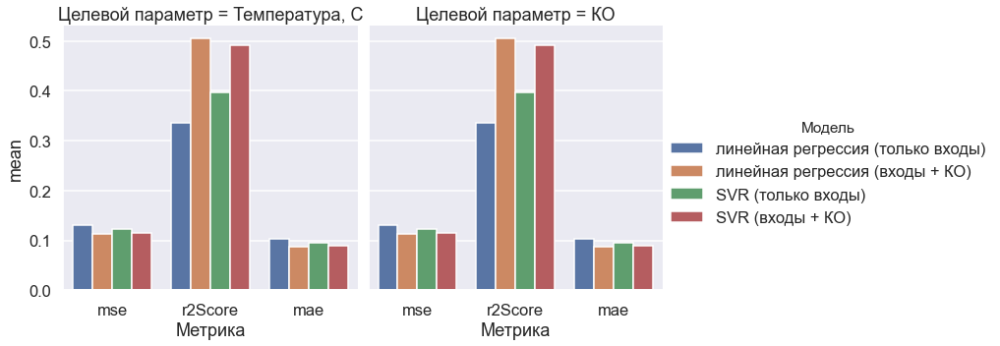

In [80]:
plt.figure(figsize=(18, 10))
ax = sns.catplot(x="Метрика", y="mean",
                hue="Модель", col="Целевой параметр",
                data=tempDF, kind="bar")
#plt.tight_layout(pad=0.4)
plt.show()

<Figure size 1296x720 with 0 Axes>

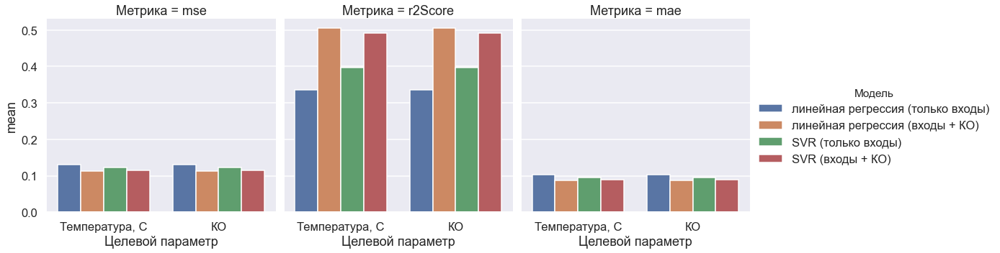

In [81]:
plt.figure(figsize=(18, 10))
ax = sns.catplot(x="Целевой параметр", y="mean",
                hue="Модель", col="Метрика",
                data=tempDF, kind="bar")
#plt.tight_layout(pad=0.4)
plt.show()

In [82]:
from keras.models import Sequential
from keras.layers import Dense, Activation

Using TensorFlow backend.


In [84]:
dataInputs=dataLagK.drop(columns=['Temp','KO']).copy()
dataTargets=dataLagK[['Temp','KO']].copy()

In [89]:
model = Sequential()
model.add(Dense(40, input_shape=(9*(lagK+1),), activation='relu', init='he_normal'))
model.add(Dense(20, activation='relu', init='he_normal'))
model.add(Dense(1, activation='linear', init='he_normal'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 40)                760       
_________________________________________________________________
dense_5 (Dense)              (None, 20)                820       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 21        
Total params: 1,601
Trainable params: 1,601
Non-trainable params: 0
_________________________________________________________________


In [90]:
model.compile(loss='mean_squared_error', optimizer='adam',
        metrics=['mean_squared_error', 'mean_absolute_error', ])

In [91]:
trainInputs, testInputs, trainTargets, testTargets = train_test_split(dataInputs,
                                                                      dataTargets['Temp'].values, test_size=0.25)

In [92]:
nnModel=model.fit(
    trainInputs, trainTargets, 
    validation_data=(testInputs, testTargets),
    epochs=500,
    verbose=1)

Train on 340 samples, validate on 114 samples
Epoch 1/500
340/340 [==============================] - 0s 1ms/step - loss: 0.1231 - mean_squared_error: 0.1231 - mean_absolute_error: 0.2709 - val_loss: 0.1128 - val_mean_squared_error: 0.1128 - val_mean_absolute_error: 0.2665
Epoch 2/500
340/340 [==============================] - 0s 56us/step - loss: 0.0728 - mean_squared_error: 0.0728 - mean_absolute_error: 0.2068 - val_loss: 0.0664 - val_mean_squared_error: 0.0664 - val_mean_absolute_error: 0.1967
Epoch 3/500
340/340 [==============================] - 0s 35us/step - loss: 0.0623 - mean_squared_error: 0.0623 - mean_absolute_error: 0.1934 - val_loss: 0.0563 - val_mean_squared_error: 0.0563 - val_mean_absolute_error: 0.1813
Epoch 4/500
340/340 [==============================] - 0s 47us/step - loss: 0.0502 - mean_squared_error: 0.0502 - mean_absolute_error: 0.1662 - val_loss: 0.0523 - val_mean_squared_error: 0.0523 - val_mean_absolute_error: 0.1736
Epoch 5/500
340/340 [======================

In [93]:
print(nnModel.history.keys())

dict_keys(['val_loss', 'val_mean_squared_error', 'val_mean_absolute_error', 'loss', 'mean_squared_error', 'mean_absolute_error'])


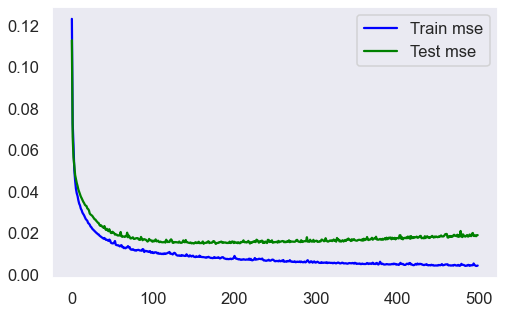

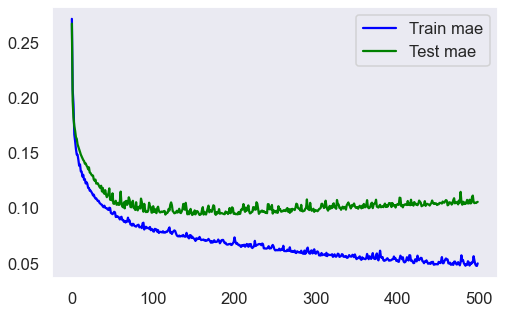

In [94]:
# из отчета можно построить графики изменения мер качества
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel.history['mean_squared_error'], color='blue', label='Train mse')
ax.plot(nnModel.history['val_mean_squared_error'], color='green', label='Test mse')
ax.legend()
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel.history['mean_absolute_error'], color='blue', label='Train mae')
ax.plot(nnModel.history['val_mean_absolute_error'], color='green', label='Test mae')
ax.legend()
plt.grid()
plt.show()

In [95]:
scores = model.evaluate(
    dataInputs.values, dataTargets['Temp'],
    verbose=1)

454/454 [==============================] - 0s 29us/step


In [96]:
pred = model.predict(dataInputs)
print( 'mse=', mtrcs.mean_squared_error(dataTargets['Temp'], pred, squared=False) )
print( 'r2=', mtrcs.r2_score(dataTargets['Temp'], pred) )
print( 'mae=', mtrcs.mean_absolute_error(dataTargets['Temp'], pred) )

mse= 0.090996574583324
r2= 0.6859032410211602
mae= 0.0670709632069831


# more deep NN

In [97]:
model2 = Sequential()
model2.add(Dense(100, input_shape=(9*(lagK+1),), activation='relu', init='he_normal'))
model2.add(Dense(100, activation='relu', init='he_normal'))
model2.add(Dense(1, activation='linear', init='he_normal'))
model2.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 100)               1900      
_________________________________________________________________
dense_8 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 101       
Total params: 12,101
Trainable params: 12,101
Non-trainable params: 0
_________________________________________________________________


In [98]:
model2.compile(loss='mean_squared_error', optimizer='adam',
        metrics=['mean_squared_error', 'mean_absolute_error', ])

In [99]:
trainInputs, testInputs, trainTargets, testTargets = train_test_split(dataInputs,
                                                                      dataTargets['Temp'].values, test_size=0.25)

In [100]:
nnModel2=model2.fit(
    trainInputs, trainTargets, 
    validation_data=(testInputs, testTargets),
    epochs=500,
    verbose=1)

Train on 340 samples, validate on 114 samples
Epoch 1/500
340/340 [==============================] - 0s 1ms/step - loss: 0.7301 - mean_squared_error: 0.7301 - mean_absolute_error: 0.7172 - val_loss: 0.0668 - val_mean_squared_error: 0.0668 - val_mean_absolute_error: 0.2101
Epoch 2/500
340/340 [==============================] - 0s 88us/step - loss: 0.1343 - mean_squared_error: 0.1343 - mean_absolute_error: 0.3139 - val_loss: 0.0828 - val_mean_squared_error: 0.0828 - val_mean_absolute_error: 0.2459
Epoch 3/500
340/340 [==============================] - 0s 103us/step - loss: 0.0554 - mean_squared_error: 0.0554 - mean_absolute_error: 0.1838 - val_loss: 0.0669 - val_mean_squared_error: 0.0669 - val_mean_absolute_error: 0.1903
Epoch 4/500
340/340 [==============================] - 0s 91us/step - loss: 0.0482 - mean_squared_error: 0.0482 - mean_absolute_error: 0.1655 - val_loss: 0.0602 - val_mean_squared_error: 0.0602 - val_mean_absolute_error: 0.1796
Epoch 5/500
340/340 [=====================

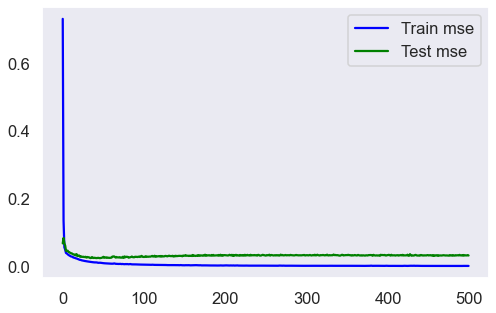

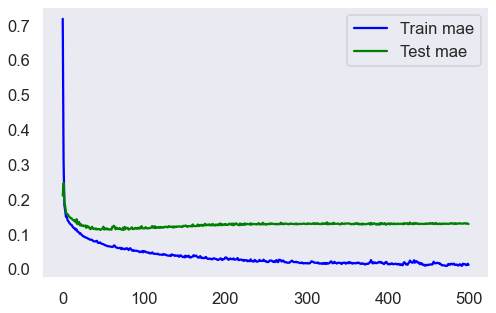

In [101]:
# из отчета можно построить графики изменения мер качества
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel2.history['mean_squared_error'], color='blue', label='Train mse')
ax.plot(nnModel2.history['val_mean_squared_error'], color='green', label='Test mse')
ax.legend()
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel2.history['mean_absolute_error'], color='blue', label='Train mae')
ax.plot(nnModel2.history['val_mean_absolute_error'], color='green', label='Test mae')
ax.legend()
plt.grid()
plt.show()

In [102]:
pred2 = model2.predict(dataInputs)
print( 'mse=', mtrcs.mean_squared_error(dataTargets['Temp'], pred2, squared=False) )
print( 'r2=', mtrcs.r2_score(dataTargets['Temp'], pred2) )
print( 'mae=', mtrcs.mean_absolute_error(dataTargets['Temp'], pred2) )

mse= 0.08883894441545302
r2= 0.7006218187213529
mae= 0.038439342134538645


In [17]:
xAxis=np.arange(1,len(pred2)+1)
fig, ax = plt.subplots(figsize=(25,5))
ax.scatter(xAxis,dataTargets['Temp'], color='green', marker='.', label='данные')
ax.scatter(xAxis,pred2, color='red', marker='.', label='модель')
ax.set_xlim(1,len(pred2)+1)
ax.legend(fontsize=14)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(25,5))
ax.plot(xAxis,dataTargets['Temp'], color='green', marker='.', label='данные')
ax.plot(xAxis,pred2, color='red', marker='.', label='модель')
ax.set_xlim(1,len(pred2)+1)
ax.legend(fontsize=14)
plt.tight_layout()
plt.show()        

NameError: name 'realNamesDict' is not defined